# DEV/TEST SPLIT

In [1]:
import os
import cv2
import json
import h5py
import math
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm
from PIL import Image
from glob import glob
import matplotlib.pyplot as plt
from IPython.display import display
import matplotlib.patches as patches
from sklearn.model_selection import StratifiedShuffleSplit, StratifiedKFold

SEED = 42
K_FOLDS = 5
PATCH_SIZES = [32, 64, 128]
TEST_SIZE = 0.2

DATASETS_CONFIG = {
    "TILDA": {
        "root": "/kaggle/input/datasets/angelolmg/tilda-400",
        "classes": {0: "hole", 1: "objects", 2: "oil spot", 3: "thread error"},
        "colors": ["#2ecc71", "#e74c3c", "#3498db", "#f1c40f", "#9b59b6"], # Good + 4 classes
        "patterns": None 
    },
    "HKU": {
        "root": "/kaggle/input/datasets/angelogoes/hku-dataset",
        "classes": {0: "BrokenEnd", 1: "Hole", 2: "NettingMultiple", 3: "ThickBar", 4: "ThinBar", 5: "Knots"},
        "colors": ["#009B00", "#FF0000", "#0000FF", "#FFA500", "#800080", "#00FFFF", "#9b59b6"], # Good + 6 classes
        "patterns": [
            "box-patterned-fabric_with_groundtruth",
            "dot-patterned_fabric_with_groundtruth",
            "star-patterned fabric_with_groundtruth"
        ]
    }
}

BASE_DIR = "/kaggle/working"
METADATA_DIR = f"{BASE_DIR}/metadata"
OPTIMAL_PARAMS_JSON_PATH = f"{METADATA_DIR}/optimal_alpha_beta_params.json"
SENSITIVITY_PLOT_PATH = f"{METADATA_DIR}/sensitivity_grid_2x3.png"

In [2]:
def build_dataset_census(dataset_type):
    """Scans directories and constructs a standardized DataFrame containing file paths and classes."""
    cfg = DATASETS_CONFIG[dataset_type]
    census_data = []
    
    print(f"🔍 Starting census for: {dataset_type}")

    if dataset_type == "TILDA":
        # TILDA Logic: Direct glob at root directory
        img_paths = sorted(glob(os.path.join(cfg['root'], "images", "*.tif")))
        for p in img_paths:
            base = os.path.splitext(os.path.basename(p))[0]
            lbl_path = os.path.join(cfg['root'], "labels", base + ".txt")
            msk_path = os.path.join(cfg['root'], "masks", base + ".png")
            
            # If label file does not exist, assume class 'good'
            if not os.path.exists(lbl_path):
                c_name, c_idx = "good", 0
            else:
                with open(lbl_path, "r") as f:
                    first_line = f.readline().split()
                    c_idx = int(first_line[0]) + 1 if first_line else 0
                    c_name = cfg['classes'].get(c_idx - 1, "good")
            
            census_data.append({
                "img_id": base, 
                "img_path": p, 
                "msk_path": msk_path, 
                "class_name": c_name, 
                "class_idx": c_idx,
                "fabric_type": "plain"  # TILDA uses a single plain pattern
            })

    elif dataset_type == "HKU":
        # HKU Logic: Subdirectory scanning (Patterns -> Classes)
        for pattern in cfg['patterns']:
            pattern_path = os.path.join(cfg['root'], pattern)
            if not os.path.exists(pattern_path): 
                continue
            
            # Extract fabric pattern (e.g., "box", "dot", "star") from the root folder name
            # Example: "box-patterned-fabric_with_groundtruth" -> "box"
            fabric_label = pattern.split('-')[0]
            prefix = fabric_label  # Used to ensure a unique img_id
            
            for class_folder in os.listdir(pattern_path):
                class_path = os.path.join(pattern_path, class_folder)
                if not os.path.isdir(class_path): 
                    continue

                is_good = class_folder == "Reference"
                all_bmps = glob(os.path.join(class_path, "*.bmp"))
                # Filter to extract original images only, excluding ground truth masks ("groundT_")
                image_paths = [p for p in all_bmps if not os.path.basename(p).startswith("groundT_")]

                for img_p in image_paths:
                    base = os.path.basename(img_p)
                    # For HKU, the mask is stored in the same directory with a "groundT_" prefix
                    # For the 'Reference' directory, no defect mask exists (set to None)
                    msk_p = os.path.join(class_path, f"groundT_{base}") if not is_good else None
                    
                    # Map class name to corresponding index
                    if is_good:
                        c_name, c_idx = "good", 0
                    else:
                        c_name = class_folder
                        # Invert dictionary lookup to find the index by class name
                        c_idx = [k for k, v in cfg['classes'].items() if v == c_name][0] + 1

                    census_data.append({
                        "img_id": f"{prefix}_{os.path.splitext(base)[0]}",
                        "img_path": img_p,
                        "msk_path": msk_p,
                        "class_name": c_name,
                        "class_idx": c_idx,
                        "fabric_type": fabric_label
                    })

    df = pd.DataFrame(census_data)
    print(f"✅ Census completed: {len(df)} images found.")
    return df


def perform_dev_test_split_and_save_json(
    df_census: pd.DataFrame, 
    dataset_name: str, 
    output_dir: str, 
    test_size: float = 0.20, 
    seed: int = SEED
) -> tuple[pd.DataFrame, pd.DataFrame, str]:
    """
    Splits dataset census into Dev (80%) and Test (20%) sets using class-stratified sampling,
    and persists the image ID sets to a JSON file for strict evaluation reproducibility.
    
    Args:
        df_census (pd.DataFrame): Dataframe output from build_dataset_census.
        dataset_name (str): Identifier name (e.g., 'TILDA' or 'HKU').
        output_dir (str): Directory where the metadata JSON will be saved.
        test_size (float): Holdout test ratio. Default is 0.20 (20%).
        seed (int): Random seed for reproducibility. Default is 42.
        
    Returns:
        tuple[pd.DataFrame, pd.DataFrame, str]: (df_dev, df_test, json_filepath)
    """
    os.makedirs(output_dir, exist_ok=True)
    
    # 1. Execute Class-Stratified Split
    sss = StratifiedShuffleSplit(n_splits=1, test_size=test_size, random_state=seed)
    
    # Stratify strictly using class_idx
    dev_idx, test_idx = next(sss.split(df_census, df_census['class_idx']))

    df_dev = df_census.iloc[dev_idx].copy().reset_index(drop=True)
    df_test = df_census.iloc[test_idx].copy().reset_index(drop=True)

    # 2. Extract uniquely identifiable image IDs
    dev_image_ids = df_dev['img_id'].tolist()
    test_image_ids = df_test['img_id'].tolist()

    # 3. Construct Metadata Dictionary
    split_metadata = {
        "dataset_name": dataset_name,
        "seed": seed,
        "test_ratio": test_size,
        "dev_ratio": 1.0 - test_size,
        "counts": {
            "total_images": len(df_census),
            "dev_images": len(dev_image_ids),
            "test_images": len(test_image_ids)
        },
        "dev_image_ids": dev_image_ids,
        "test_image_ids": test_image_ids
    }

    # 4. Save to JSON File
    json_filename = f"{dataset_name.lower()}_splits_seed{seed}.json"
    json_filepath = os.path.join(output_dir, json_filename)
    
    with open(json_filepath, "w", encoding="utf-8") as f:
        json.dump(split_metadata, f, indent=4)
        
    print(f"✅ Split metadata successfully exported to: {json_filepath}")
    print(f"   └── Dev Set:  {len(dev_image_ids)} images ({len(dev_image_ids)/len(df_census):.1%})")
    print(f"   └── Test Set: {len(test_image_ids)} images ({len(test_image_ids)/len(df_census):.1%})\n")

    return df_dev, df_test, json_filepath


def load_split_from_json(json_filepath: str, df_census: pd.DataFrame) -> tuple[pd.DataFrame, pd.DataFrame]:
    """
    Utility function to load an existing JSON metadata file during preprocessing/testing
    and reconstruct exact Dev and Test DataFrames from the full census.
    """
    if not os.path.exists(json_filepath):
        raise FileNotFoundError(f"Split file not found: {json_filepath}")
        
    with open(json_filepath, "r", encoding="utf-8") as f:
        metadata = json.load(f)
        
    dev_ids = set(metadata["dev_image_ids"])
    test_ids = set(metadata["test_image_ids"])
    
    df_dev = df_census[df_census['img_id'].isin(dev_ids)].copy().reset_index(drop=True)
    df_test = df_census[df_census['img_id'].isin(test_ids)].copy().reset_index(drop=True)
    
    return df_dev, df_test

def analyze_and_plot_split_proportions(
    df_census: pd.DataFrame, 
    df_dev: pd.DataFrame, 
    df_test: pd.DataFrame, 
    dataset_name: str,
    stratify_col: str = 'class_name'
) -> pd.DataFrame:
    """
    Analyzes and visualizes class distribution proportions across Census, Dev, and Test splits
    to validate stratification fidelity and detect distribution drift.

    Args:
        df_census (pd.DataFrame): Full dataset census DataFrame.
        df_dev (pd.DataFrame): Partitioned Development set DataFrame.
        df_test (pd.DataFrame): Partitioned Holdout Test set DataFrame.
        dataset_name (str): Dataset identifier for plot titles (e.g., 'TILDA' or 'HKU').
        stratify_col (str): Column name used for stratification validation. Default is 'class_name'.

    Returns:
        pd.DataFrame: Comparative proportion table across splits.
    """
    # 1. Compute absolute counts per split
    census_counts = df_census[stratify_col].value_counts()
    dev_counts = df_dev[stratify_col].value_counts()
    test_counts = df_test[stratify_col].value_counts()

    # 2. Build summary DataFrame
    df_summary = pd.DataFrame({
        'Census_Count': census_counts,
        'Dev_Count': dev_counts,
        'Test_Count': test_counts
    }).fillna(0).astype(int)

    # 3. Compute relative percentage distributions (%)
    df_summary['Census_%'] = (df_summary['Census_Count'] / len(df_census)) * 100
    df_summary['Dev_%'] = (df_summary['Dev_Count'] / len(df_dev)) * 100
    df_summary['Test_%'] = (df_summary['Test_Count'] / len(df_test)) * 100

    # Sort by census count descending
    df_summary = df_summary.sort_values(by='Census_Count', ascending=False)

    # Display clean summary table in console
    print(f"\n{'='*80}")
    print(f"📊 STRATIFICATION ANALYSIS: {dataset_name.upper()} (Target: '{stratify_col}')")
    print(f"{'='*80}")
    
    display_cols = ['Census_Count', 'Census_%', 'Dev_Count', 'Dev_%', 'Test_Count', 'Test_%']
    formatted_df = df_summary[display_cols].copy()
    for col in ['Census_%', 'Dev_%', 'Test_%']:
        formatted_df[col] = formatted_df[col].apply(lambda x: f"{x:.2f}%")
        
    print(formatted_df.to_string())
    print("-" * 80)

    # 4. Plot comparative bar chart
    fig, ax = plt.subplots(figsize=(12, 6))
    
    categories = df_summary.index.tolist()
    x = np.arange(len(categories))
    width = 0.25

    rects1 = ax.bar(x - width, df_summary['Census_%'], width, label='Full Census', color='#2b5c8f')
    rects2 = ax.bar(x, df_summary['Dev_%'], width, label='Dev Set (80%)', color='#4682b4')
    rects3 = ax.bar(x + width, df_summary['Test_%'], width, label='Test Set (20%)', color='#e74c3c')

    ax.set_ylabel('Percentage of Dataset (%)', fontsize=12)
    ax.set_title(f'Class Stratification Fidelity across Splits — {dataset_name}', fontsize=14)
    ax.set_xticks(x)
    ax.set_xticklabels(categories, rotation=30, ha='right', fontsize=10)
    ax.legend(fontsize=11)
    ax.grid(axis='y', linestyle='--', alpha=0.5)

    # Add value labels on top of bars
    def autolabel(rects):
        for rect in rects:
            height = rect.get_height()
            ax.annotate(f'{height:.1f}%',
                        xy=(rect.get_x() + rect.get_width() / 2, height),
                        xytext=(0, 3),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom', fontsize=8)

    autolabel(rects1)
    autolabel(rects2)
    autolabel(rects3)

    plt.tight_layout()
    plt.show()

    return df_summary

🔍 Starting census for: TILDA
✅ Census completed: 400 images found.
✅ Split metadata successfully exported to: /kaggle/working/metadata/tilda_splits_seed42.json
   └── Dev Set:  320 images (80.0%)
   └── Test Set: 80 images (20.0%)


📊 STRATIFICATION ANALYSIS: TILDA (Target: 'class_name')
              Census_Count Census_%  Dev_Count   Dev_%  Test_Count  Test_%
class_name                                                                
hole                   100   25.00%         80  25.00%          20  25.00%
objects                100   25.00%         80  25.00%          20  25.00%
oil spot               100   25.00%         80  25.00%          20  25.00%
thread error           100   25.00%         80  25.00%          20  25.00%
--------------------------------------------------------------------------------


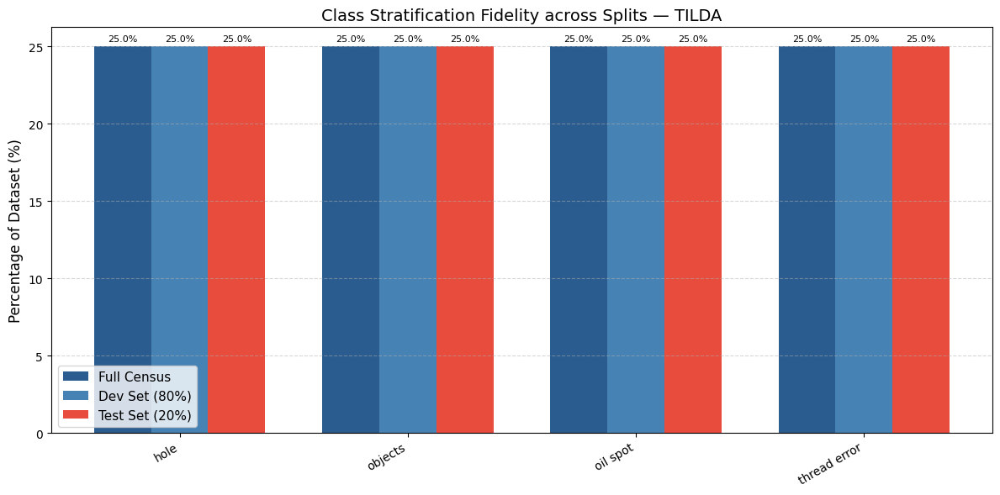

In [3]:
TARGET_DATASET = "TILDA"  # or "HKU"

# Step 1: Build Full Census
df_census = build_dataset_census(TARGET_DATASET)

# Step 2: Perform 80/20 Stratified Split & Export Metadata JSON
df_dev, df_test, split_json_path = perform_dev_test_split_and_save_json(
    df_census=df_census,
    dataset_name=TARGET_DATASET,
    output_dir=METADATA_DIR,
    test_size=TEST_SIZE,
    seed=SEED
)

# Step 3: Verify downstream reloading capability (Sanity Check)
df_dev_reloaded, df_test_reloaded = load_split_from_json(split_json_path, df_census)
assert len(df_dev) == len(df_dev_reloaded), "Dev split reconstruction mismatch!"
assert len(df_test) == len(df_test_reloaded), "Test split reconstruction mismatch!"

# Analyze primary class stratification fidelity
df_prop_summary = analyze_and_plot_split_proportions(
    df_census=df_census,
    df_dev=df_dev,
    df_test=df_test,
    dataset_name=TARGET_DATASET,
    stratify_col='class_name'
)

🔍 Starting census for: HKU
✅ Census completed: 166 images found.
✅ Split metadata successfully exported to: /kaggle/working/metadata/hku_splits_seed42.json
   └── Dev Set:  132 images (79.5%)
   └── Test Set: 34 images (20.5%)


📊 STRATIFICATION ANALYSIS: HKU (Target: 'class_name')
                 Census_Count Census_%  Dev_Count   Dev_%  Test_Count  Test_%
class_name                                                                   
good                       85   51.20%         67  50.76%          18  52.94%
ThickBar                   16    9.64%         13   9.85%           3   8.82%
BrokenEnd                  15    9.04%         12   9.09%           3   8.82%
NettingMultiple            15    9.04%         12   9.09%           3   8.82%
Hole                       15    9.04%         12   9.09%           3   8.82%
ThinBar                    15    9.04%         12   9.09%           3   8.82%
Knots                       5    3.01%          4   3.03%           1   2.94%
---------------

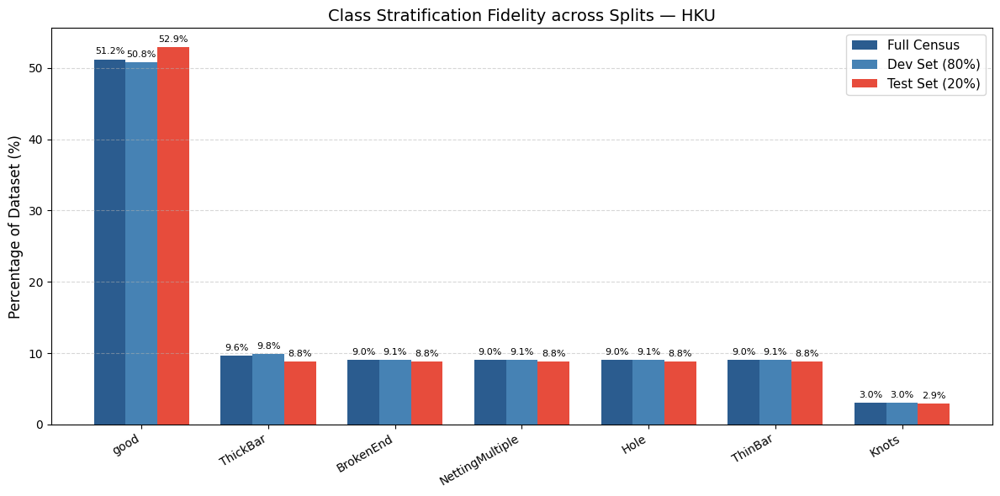


📊 STRATIFICATION ANALYSIS: HKU (FABRIC ANALYSIS) (Target: 'fabric_type')
             Census_Count Census_%  Dev_Count   Dev_%  Test_Count  Test_%
fabric_type                                                              
dot                    60   36.14%         51  38.64%           9  26.47%
box                    56   33.73%         45  34.09%          11  32.35%
star                   50   30.12%         36  27.27%          14  41.18%
--------------------------------------------------------------------------------


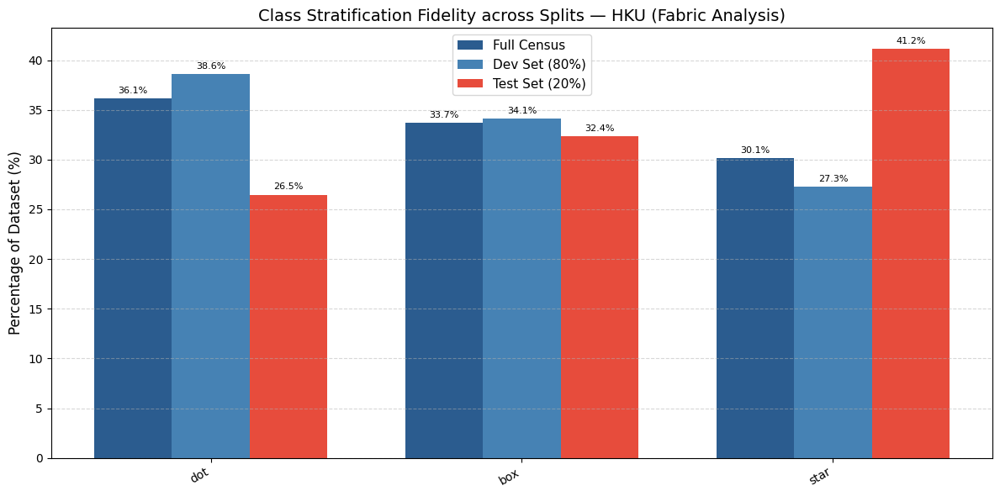

In [4]:
TARGET_DATASET = "HKU"  # or "HKU"

# Step 1: Build Full Census
df_census = build_dataset_census(TARGET_DATASET)

# Step 2: Perform 80/20 Stratified Split & Export Metadata JSON
df_dev, df_test, split_json_path = perform_dev_test_split_and_save_json(
    df_census=df_census,
    dataset_name=TARGET_DATASET,
    output_dir=METADATA_DIR,
    test_size=TEST_SIZE,
    seed=SEED
)

# Step 3: Verify downstream reloading capability (Sanity Check)
df_dev_reloaded, df_test_reloaded = load_split_from_json(split_json_path, df_census)
assert len(df_dev) == len(df_dev_reloaded), "Dev split reconstruction mismatch!"
assert len(df_test) == len(df_test_reloaded), "Test split reconstruction mismatch!"

# Analyze primary class stratification fidelity
df_prop_summary = analyze_and_plot_split_proportions(
    df_census=df_census,
    df_dev=df_dev,
    df_test=df_test,
    dataset_name=TARGET_DATASET,
    stratify_col='class_name'
)

# For HKU: Check secondary fabric pattern drift
if TARGET_DATASET == "HKU":
    df_fabric_summary = analyze_and_plot_split_proportions(
        df_census=df_census,
        df_dev=df_dev,
        df_test=df_test,
        dataset_name=f"{TARGET_DATASET} (Fabric Analysis)",
        stratify_col='fabric_type'
    )

# ALFA/BETA GRID SEARCH

In [5]:
def get_patch_counts(mask_binary: np.ndarray, p_size: int) -> np.ndarray:
    """
    Splits a binary mask into a grid of patches and counts non-zero defect pixels per patch.
    """
    H, W = mask_binary.shape
    H_trunc = (H // p_size) * p_size
    W_trunc = (W // p_size) * p_size
    mask_trunc = mask_binary[:H_trunc, :W_trunc]
    
    # Reshape into patch blocks: (num_patches_Y, p_size, num_patches_X, p_size)
    patches = mask_trunc.reshape(H_trunc // p_size, p_size, W_trunc // p_size, p_size)
    return patches.sum(axis=(1, 3)).flatten()


def run_alpha_beta_grid_search(
    df_dev: pd.DataFrame, 
    dataset_name: str,
    patch_sizes: list = [32, 64, 128], 
    grid_steps: int = 101
) -> tuple[dict, dict, np.ndarray]:
    """
    Executes a vectorized grid search for optimal alpha and beta thresholds 
    for a SINGLE dataset strictly using its Development Set (df_dev).
    
    Dynamic Threshold Formula:
        thresh = max(1, min(alpha * total_defect_area, beta * patch_area))
    """
    grid_values = np.linspace(0.0, 1.0, grid_steps)
    alphas = grid_values[:, None]  # Shape: (101, 1)
    betas = grid_values[None, :]   # Shape: (1, 101)
    
    results = {}
    optimal_params = {}

    print(f"\n🔍 Processing Dev Grid Search: {dataset_name} (N = {len(df_dev)} source images)")

    for p_size in patch_sizes:
        patch_area = p_size * p_size
        thresh_beta = betas * patch_area  # Shape: (1, 101)
        
        iou_sum_matrix = np.zeros((grid_steps, grid_steps), dtype=np.float64)
        valid_image_count = 0

        for _, row in tqdm(df_dev.iterrows(), total=len(df_dev), desc=f"{dataset_name} {p_size}x{p_size}"):
            if not row['msk_path'] or not os.path.exists(row['msk_path']):
                continue

            mask = cv2.imread(row['msk_path'], cv2.IMREAD_GRAYSCALE)
            if mask is None:
                continue

            mask_bin = (mask > 0).astype(np.uint32)
            total_defect_px = mask_bin.sum()

            # Skip defect-free images during sensitivity tuning
            if total_defect_px == 0:
                continue

            valid_image_count += 1
            counts = get_patch_counts(mask_bin, p_size)

            thresh_alpha = alphas * total_defect_px  # Shape: (101, 1)
            effective_thresh = np.maximum(1, np.minimum(thresh_alpha, thresh_beta))  # Shape: (101, 101)

            # Vectorized defect flag: counts shape (N,) -> broadcast to (N, 101, 101)
            is_defective = counts[:, None, None] >= effective_thresh[None, :, :]

            tp_img = np.sum(counts[:, None, None] * is_defective, axis=0)
            fp_img = np.sum((patch_area - counts[:, None, None]) * is_defective, axis=0)

            denom = total_defect_px + fp_img
            iou_img = np.where(denom > 0, tp_img / denom, 0.0)
            iou_sum_matrix += iou_img

        mean_iou_matrix = iou_sum_matrix / max(1, valid_image_count)
        results[str(p_size)] = mean_iou_matrix

        best_idx = np.unravel_index(np.argmax(mean_iou_matrix), mean_iou_matrix.shape)
        optimal_params[str(p_size)] = {
            'alpha': float(grid_values[best_idx[0]]),
            'beta': float(grid_values[best_idx[1]]),
            'max_iou': float(mean_iou_matrix[best_idx])
        }

    return results, optimal_params, grid_values


def plot_2x3_sensitivity_grid(
    results: dict, 
    optimal_params: dict, 
    grid_values: np.ndarray, 
    save_path: str = '/kaggle/working/sensitivity_grid_2x3.png'
):
    """
    Plots a 2x3 heatmap grid displaying alpha/beta sensitivity across resolutions for TILDA and HKU.
    """
    fig, axes = plt.subplots(2, 3, figsize=(22, 12))
    # fig.suptitle('Dynamic Threshold Sensitivity Analysis (Development Set)', fontsize=22, y=0.98)

    datasets = ['TILDA', 'HKU']
    patch_sizes = [32, 64, 128]

    # Pre-calculate tick positions (every 0.1 step)
    tick_positions = [idx + 0.5 for idx, val in enumerate(grid_values) if np.isclose(val * 10, np.round(val * 10))]
    tick_labels = [f"{val:.1f}" for val in grid_values if np.isclose(val * 10, np.round(val * 10))]

    for r_idx, ds_name in enumerate(datasets):
        for c_idx, p_size in enumerate(patch_sizes):
            ax = axes[r_idx, c_idx]
            data = results[ds_name][str(p_size)]
            opt = optimal_params[ds_name][str(p_size)]

            sns.heatmap(data, ax=ax, cmap="viridis", cbar=True)

            ax.collections[0].colorbar.ax.tick_params(labelsize=16)

            ax.set_xticks(tick_positions)
            ax.set_xticklabels(tick_labels, rotation=45, fontsize=14)
            ax.set_yticks(tick_positions)
            ax.set_yticklabels(tick_labels, rotation=0, fontsize=14)
            ax.invert_yaxis()  # Cartesian orientation: (0,0) at bottom-left

            ds_label = ds_name
            ds_label = "TILDA-400" if (ds_name == "TILDA") else ds_label
            
            ax.set_title(f"{ds_label} — {p_size}x{p_size}", fontsize=18)
            ax.set_xlabel(r'$\beta$ (Patch Area % Cap)', fontsize=16)
            ax.set_ylabel(r'$\alpha$ (Total Defect Area %)', fontsize=16)

            ax.tick_params(axis='x', labelsize=14, rotation=45)
            ax.tick_params(axis='y', labelsize=14, rotation=0)

            # Highlight optimal cell
            idx_alpha = int(round(opt['alpha'] * (len(grid_values) - 1)))
            idx_beta = int(round(opt['beta'] * (len(grid_values) - 1)))

            rect = plt.Rectangle((idx_beta, idx_alpha), 1, 1, fill=False, edgecolor='red', lw=2.5)
            ax.add_patch(rect)

            annotation_text = (
                fr"$\alpha^*$: {opt['alpha']:.2f}, $\beta^*$: {opt['beta']:.2f}" 
                + f"\nMax IoU: {opt['max_iou']:.3f}"
            )
            
            ax.text(
                0.95, 0.95, annotation_text,
                transform=ax.transAxes, ha='right', va='top',
                color='black', fontsize=16,
                bbox=dict(boxstyle="square,pad=0.4", fc="white", ec="red", alpha=0.9, lw=1.5)
            )

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"✅ Sensitivity grid plot saved to: {save_path}")

In [6]:
# Store Dev DataFrames explicitly by dataset name
dev_sets = {}

for target_ds in ["TILDA", "HKU"]:
    df_census = build_dataset_census(target_ds)
    df_dev, df_test, split_json_path = perform_dev_test_split_and_save_json(
        df_census=df_census,
        dataset_name=target_ds,
        output_dir=METADATA_DIR,
        test_size=TEST_SIZE,
        seed=SEED
    )
    
    dev_sets[target_ds] = df_dev

# Run Grid Search cleanly per dataset
all_grid_results = {}
all_optimal_params = {}

# 1. Initialize result containers for multi-dataset tracking
all_grid_results = {}
all_optimal_params = {}
grid_values_ref = None

# 2. Sequential Grid Search over Development Sets
for ds_name, df_d in dev_sets.items():
    grid_results, optimal_params, grid_values = run_alpha_beta_grid_search(
        df_dev=df_d,
        dataset_name=ds_name,
        patch_sizes=PATCH_SIZES,
        grid_steps=101
    )
    
    # Store outputs indexed by dataset name for the 2x3 plotter
    all_grid_results[ds_name] = grid_results
    all_optimal_params[ds_name] = optimal_params
    grid_values_ref = grid_values  # Retain reference array for axis ticking

🔍 Starting census for: TILDA
✅ Census completed: 400 images found.
✅ Split metadata successfully exported to: /kaggle/working/metadata/tilda_splits_seed42.json
   └── Dev Set:  320 images (80.0%)
   └── Test Set: 80 images (20.0%)

🔍 Starting census for: HKU
✅ Census completed: 166 images found.
✅ Split metadata successfully exported to: /kaggle/working/metadata/hku_splits_seed42.json
   └── Dev Set:  132 images (79.5%)
   └── Test Set: 34 images (20.5%)


🔍 Processing Dev Grid Search: TILDA (N = 320 source images)


TILDA 128x128: 100%|██████████| 320/320 [00:01<00:00, 167.68it/s]



🔍 Processing Dev Grid Search: HKU (N = 132 source images)


HKU 128x128: 100%|██████████| 132/132 [00:00<00:00, 934.43it/s] 


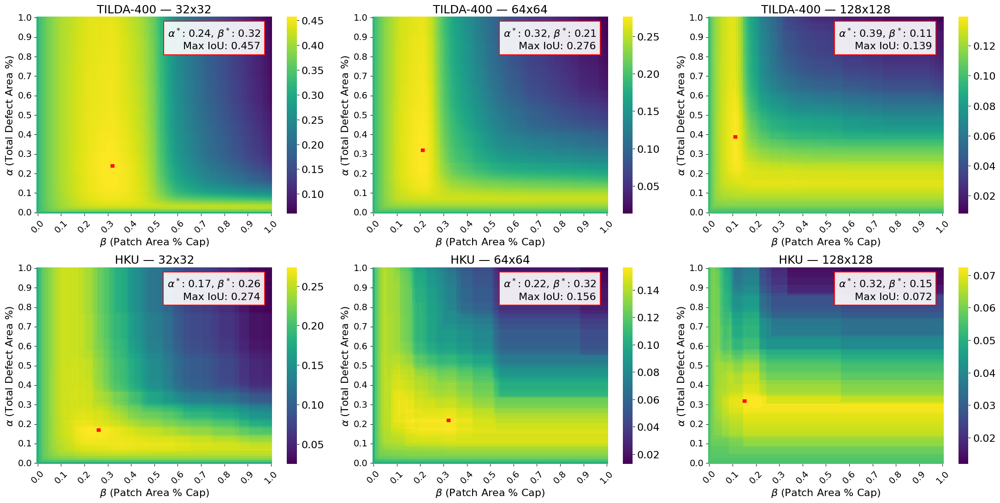

✅ Sensitivity grid plot saved to: /kaggle/working/metadata/sensitivity_grid_2x3.png

✅ Optimal hyperparameters exported to: /kaggle/working/metadata/optimal_alpha_beta_params.json
{
    "TILDA": {
        "32": {
            "alpha": 0.24,
            "beta": 0.32,
            "max_iou": 0.45736453495984425
        },
        "64": {
            "alpha": 0.32,
            "beta": 0.21,
            "max_iou": 0.2758882723106721
        },
        "128": {
            "alpha": 0.39,
            "beta": 0.11,
            "max_iou": 0.13925786777151544
        }
    },
    "HKU": {
        "32": {
            "alpha": 0.17,
            "beta": 0.26,
            "max_iou": 0.27365695199941875
        },
        "64": {
            "alpha": 0.22,
            "beta": 0.32,
            "max_iou": 0.15639914844380257
        },
        "128": {
            "alpha": 0.32,
            "beta": 0.15,
            "max_iou": 0.07236703877212393
        }
    }
}


In [7]:
# 3. Render and save the consolidated 2x3 heatmap grid
plot_2x3_sensitivity_grid(
    results=all_grid_results,
    optimal_params=all_optimal_params,
    grid_values=grid_values_ref,
    save_path=SENSITIVITY_PLOT_PATH
)

# 4. Save optimal parameters to JSON for downstream patch cutting
with open(OPTIMAL_PARAMS_JSON_PATH, 'w', encoding='utf-8') as f:
    json.dump(all_optimal_params, f, indent=4)

print(f"\n✅ Optimal hyperparameters exported to: {OPTIMAL_PARAMS_JSON_PATH}")
print(json.dumps(all_optimal_params, indent=4))

# PATCH EXCTRACTION

In [8]:
def assign_kfold_splits_and_update_json(
    df_dev: pd.DataFrame,
    json_filepath: str,
    n_splits: int = 5,
    seed: int = SEED
) -> pd.DataFrame:
    """
    Appends class-stratified fold indices (0 to n_splits-1) to df_dev and 
    updates the split metadata JSON to maintain a single source of truth.
    
    Args:
        df_dev (pd.DataFrame): Isolated Development set DataFrame.
        json_filepath (str): Path to the existing metadata JSON created during Dev/Test split.
        n_splits (int): Number of cross-validation folds. Default is 5.
        seed (int): Random seed for reproducibility. Default is 42.
        
    Returns:
        pd.DataFrame: df_dev with an added 'fold' column (int8).
    """
    if not os.path.exists(json_filepath):
        raise FileNotFoundError(
            f"Metadata JSON not found at: {json_filepath}. "
            "Run perform_dev_test_split_and_save_json first."
        )

    df_dev = df_dev.copy().reset_index(drop=True)
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
    
    df_dev['fold'] = -1
    fold_dict = {}

    for fold_idx, (_, val_idx) in enumerate(skf.split(df_dev, df_dev['class_idx'])):
        df_dev.loc[val_idx, 'fold'] = fold_idx
        fold_dict[str(fold_idx)] = {
            "val_count": len(val_idx),
            "val_image_ids": df_dev.loc[val_idx, 'img_id'].tolist()
        }

    df_dev['fold'] = df_dev['fold'].astype('int8')

    # Read, update, and write back to the single JSON file
    with open(json_filepath, 'r', encoding='utf-8') as f:
        metadata = json.load(f)

    # Sanity check: Ensure df_dev image count matches JSON dev count
    if len(df_dev) != metadata['counts']['dev_images']:
        raise ValueError(
            f"Mismatch between df_dev length ({len(df_dev)}) "
            f"and metadata dev count ({metadata['counts']['dev_images']})."
        )

    metadata['k_fold'] = {
        "n_splits": n_splits,
        "seed": seed,
        "folds": fold_dict
    }
    
    with open(json_filepath, 'w', encoding='utf-8') as f:
        json.dump(metadata, f, indent=4)
        
    print(f"✅ Appended {n_splits}-fold split structure to master metadata: {json_filepath}")
    return df_dev

def process_to_h5_with_folds(
    df_split: pd.DataFrame,
    output_dir: str,
    filename: str,
    dataset_name: str,
    patch_size: int,
    opt_params_json_path: str = '/kaggle/working/optimal_alpha_beta_params.json',
    batch_chunk_size: int = 5000
) -> None:
    """
    Extracts spatial patches using optimal dynamic thresholds (alpha*, beta*),
    embeds fold assignments into a unified HDF5 container, and accumulates
    real geometric pixel intersection/union totals as metadata attributes.
    """
    if not os.path.exists(opt_params_json_path):
        raise FileNotFoundError(f"Optimal parameters JSON not found at: {opt_params_json_path}")
        
    with open(opt_params_json_path, 'r', encoding='utf-8') as f:
        all_optimal_params = json.load(f)
        
    try:
        opt_config = all_optimal_params[dataset_name][str(patch_size)]
        alpha_star = opt_config['alpha']
        beta_star = opt_config['beta']
        print(f"🔒 Loaded parameters for [{dataset_name} | {patch_size}x{patch_size}]: "
              f"alpha*={alpha_star:.4f}, beta*={beta_star:.4f}")
    except KeyError as e:
        raise KeyError(f"Key {e} not found in {opt_params_json_path}.")

    os.makedirs(output_dir, exist_ok=True)
    h5_path = os.path.join(output_dir, filename)
    
    str_dtype = h5py.string_dtype(encoding='utf-8')
    patch_area = patch_size ** 2

    # Global 64-bit accumulators for geometric Mean Pixel IoU
    split_pixel_intersection = 0
    split_pixel_union = 0

    # In-memory chunk buffers
    buf_X, buf_ymulti, buf_ybin = [], [], []
    buf_groups, buf_coords, buf_fabrics, buf_folds = [], [], [], []

    has_folds = 'fold' in df_split.columns

    with h5py.File(h5_path, 'w') as hf:
        ds_X = hf.create_dataset(
            'X', shape=(0, patch_size, patch_size, 3), maxshape=(None, patch_size, patch_size, 3),
            dtype=np.uint8, chunks=(128, patch_size, patch_size, 3), compression='gzip', compression_opts=4
        )
        ds_ymulti = hf.create_dataset('y_multi', shape=(0,), maxshape=(None,), dtype=np.int8, chunks=(1024,), compression='gzip')
        ds_ybin = hf.create_dataset('y_binary', shape=(0,), maxshape=(None,), dtype=np.int8, chunks=(1024,), compression='gzip')
        ds_groups = hf.create_dataset('groups', shape=(0,), maxshape=(None,), dtype=str_dtype, chunks=(1024,))
        ds_coords = hf.create_dataset('coords', shape=(0, 2), maxshape=(None, 2), dtype=np.int16, chunks=(1024, 2))
        ds_fabrics = hf.create_dataset('fabrics', shape=(0,), maxshape=(None,), dtype=str_dtype, chunks=(1024,))
        ds_folds = hf.create_dataset('folds', shape=(0,), maxshape=(None,), dtype=np.int8, chunks=(1024,))

        def flush_buffer_to_h5():
            nonlocal buf_X, buf_ymulti, buf_ybin, buf_groups, buf_coords, buf_fabrics, buf_folds
            if not buf_X:
                return
            
            n_new = len(buf_X)
            curr_size = ds_X.shape[0]
            new_size = curr_size + n_new
            
            ds_X.resize((new_size, patch_size, patch_size, 3))
            ds_ymulti.resize((new_size,))
            ds_ybin.resize((new_size,))
            ds_groups.resize((new_size,))
            ds_coords.resize((new_size, 2))
            ds_fabrics.resize((new_size,))
            ds_folds.resize((new_size,))

            ds_X[curr_size:new_size] = np.array(buf_X, dtype=np.uint8)
            ds_ymulti[curr_size:new_size] = np.array(buf_ymulti, dtype=np.int8)
            ds_ybin[curr_size:new_size] = np.array(buf_ybin, dtype=np.int8)
            ds_groups[curr_size:new_size] = np.array(buf_groups, dtype=str_dtype)
            ds_coords[curr_size:new_size] = np.array(buf_coords, dtype=np.int16)
            ds_fabrics[curr_size:new_size] = np.array(buf_fabrics, dtype=str_dtype)
            ds_folds[curr_size:new_size] = np.array(buf_folds, dtype=np.int8)

            buf_X.clear(); buf_ymulti.clear(); buf_ybin.clear()
            buf_groups.clear(); buf_coords.clear(); buf_fabrics.clear(); buf_folds.clear()

        # Image processing loop
        for _, row in tqdm(df_split.iterrows(), total=len(df_split), desc=f"Writing {filename}"):
            img = np.array(Image.open(row['img_path']).convert('RGB'))
            
            if row['msk_path'] and os.path.exists(row['msk_path']):
                mask = np.array(Image.open(row['msk_path']))
                if mask.ndim == 3:
                    mask = mask[:, :, 0]
            else:
                mask = np.zeros(img.shape[:2], dtype=np.uint8)

            total_defect_px = np.count_nonzero(mask)

            if total_defect_px > 0:
                req_dynamic = max(1, int(total_defect_px * alpha_star))
                final_thresh = min(req_dynamic, int(patch_area * beta_star))
            else:
                final_thresh = 0

            image_fold = int(row['fold']) if has_folds else -1

            h, w = img.shape[:2]
            for i in range(h // patch_size):
                for j in range(w // patch_size):
                    y, x = i * patch_size, j * patch_size
                    p_mask = mask[y:y+patch_size, x:x+patch_size]
                    
                    p_defect_px = np.count_nonzero(p_mask)
                    is_def = (total_defect_px > 0) and (p_defect_px >= final_thresh)
                    
                    # 📐 GEOMETRIC PIXEL METRICS COMPUTATION
                    # Intersection: Active mask pixels inside a patch flagged as positive
                    p_inter = p_defect_px if is_def else 0
                    
                    # Union: Full patch area if flagged positive, else missed defect pixels (False Negatives)
                    p_union = patch_area if is_def else p_defect_px
                    
                    split_pixel_intersection += p_inter
                    split_pixel_union += p_union

                    buf_X.append(img[y:y+patch_size, x:x+patch_size])
                    buf_ymulti.append(int(row['class_idx']) if is_def else 0)
                    buf_ybin.append(1 if is_def else 0)
                    buf_groups.append(str(row['img_id']))
                    buf_coords.append([i, j])
                    buf_fabrics.append(str(row['fabric_type']))
                    buf_folds.append(image_fold)

                    if len(buf_X) >= batch_chunk_size:
                        flush_buffer_to_h5()

        flush_buffer_to_h5()

        # 🏷️ PERSIST METADATA ATTRIBUTES IN HDF5 CONTAINER
        hf.attrs['dataset_name'] = dataset_name
        hf.attrs['patch_size'] = patch_size
        hf.attrs['alpha_star'] = alpha_star
        hf.attrs['beta_star'] = beta_star
        hf.attrs['pixel_intersection'] = int(split_pixel_intersection)
        hf.attrs['pixel_union'] = int(split_pixel_union)

    print(f"✅ HDF5 Dataset written to: {h5_path}")
    print(f"   └─ Pixel Intersection: {split_pixel_intersection:,} px | Pixel Union: {split_pixel_union:,} px")

def generate_multiresolution_h5_datasets(
    dataset_name: str,
    patch_sizes: list[int],
    datasets_config: dict = DATASETS_CONFIG,
    output_base_dir: str = BASE_DIR,
    opt_params_json_path: str = "/kaggle/working/optimal_alpha_beta_params.json",
    n_splits: int = 5,
    test_size: float = 0.20,
    seed: int = SEED
) -> dict:
    """
    Executes an end-to-end multi-resolution dataset generation pipeline.
    
    Ensures image-level Dev/Test and K-Fold splits remain strictly invariant 
    across all extracted spatial patch resolutions.
    
    Args:
        dataset_name (str): Key matching DATASETS_CONFIG ('TILDA' or 'HKU').
        patch_sizes (list[int]): List of patch resolutions to extract (e.g., [32, 64, 128]).
        datasets_config (dict): Master dataset configuration dictionary.
        output_base_dir (str): Root output directory for generated HDF5 files and metadata.
        opt_params_json_path (str): Path to JSON containing optimal alpha/beta parameters.
        n_splits (int): Number of cross-validation folds. Default is 5.
        test_size (float): Proportion of dataset isolated for held-out testing. Default is 0.20.
        seed (int): Global random seed for reproducible splitting. Default is 42.
        
    Returns:
        dict: Manifest mapping each patch size to its generated HDF5 file paths and split metadata.
    """
    # 1. Input Validation
    if dataset_name not in datasets_config:
        raise KeyError(
            f"Dataset '{dataset_name}' not found in DATASETS_CONFIG. "
            f"Available keys: {list(datasets_config.keys())}"
        )
    
    if not os.path.exists(opt_params_json_path):
        raise FileNotFoundError(
            f"Optimal parameters JSON not found at '{opt_params_json_path}'. "
            "Ensure sensitivity analysis optimization step has completed."
        )

    print(f"🛠️ INITIATING PIPELINE: {dataset_name}")
    print(f"Target Resolutions: {patch_sizes} | Folds: {n_splits} | Seed: {seed}")

    # Setup directories
    metadata_dir = os.path.join(output_base_dir, "metadata")
    os.makedirs(metadata_dir, exist_ok=True)

    # 2. Image Census Construction
    df_census = build_dataset_census(dataset_name)

    # 3. Holdout Dev/Test Split (Executed ONCE at Image Level)
    df_dev, df_test, json_filepath = perform_dev_test_split_and_save_json(
        df_census=df_census,
        dataset_name=dataset_name,
        output_dir=metadata_dir,
        test_size=test_size,
        seed=seed
    )

    # 4. Class-Stratified K-Fold Tagging (Executed ONCE at Image Level)
    df_dev = assign_kfold_splits_and_update_json(
        df_dev=df_dev,
        json_filepath=json_filepath,
        n_splits=n_splits,
        seed=seed
    )

    pipeline_manifest = {
        "dataset_name": dataset_name,
        "split_metadata_json": json_filepath,
        "resolutions": {}
    }

    # 5. Multi-Resolution HDF5 Extraction Loop
    for p_size in patch_sizes:
        print(f"\n---> Extracting Resolution: {p_size}x{p_size} px")
        
        out_dir = os.path.join(output_base_dir, f"{dataset_name.lower()}_{p_size}")
        dev_h5_filename = f"dev_set_{p_size}.h5"
        test_h5_filename = f"test_set_{p_size}.h5"

        # 5a. Extract Development Set HDF5
        process_to_h5_with_folds(
            df_split=df_dev,
            output_dir=out_dir,
            filename=dev_h5_filename,
            dataset_name=dataset_name,
            patch_size=p_size,
            opt_params_json_path=opt_params_json_path
        )

        # 5b. Extract Test Set HDF5
        process_to_h5_with_folds(
            df_split=df_test,
            output_dir=out_dir,
            filename=test_h5_filename,
            dataset_name=dataset_name,
            patch_size=p_size,
            opt_params_json_path=opt_params_json_path
        )

        # Store artifact paths in return manifest
        pipeline_manifest["resolutions"][p_size] = {
            "dev_h5": os.path.join(out_dir, dev_h5_filename),
            "test_h5": os.path.join(out_dir, test_h5_filename)
        }

    print(f"\n✅ Pipeline execution completed successfully for dataset: {dataset_name}")
    return pipeline_manifest

In [9]:
tilda_manifest = generate_multiresolution_h5_datasets(
    dataset_name="TILDA",
    patch_sizes=PATCH_SIZES,
    datasets_config=DATASETS_CONFIG,
    output_base_dir=BASE_DIR,
    opt_params_json_path=OPTIMAL_PARAMS_JSON_PATH,
    n_splits=K_FOLDS,
    test_size=TEST_SIZE,
    seed=SEED
)

🛠️ INITIATING PIPELINE: TILDA
Target Resolutions: [32, 64, 128] | Folds: 5 | Seed: 42
🔍 Starting census for: TILDA
✅ Census completed: 400 images found.
✅ Split metadata successfully exported to: /kaggle/working/metadata/tilda_splits_seed42.json
   └── Dev Set:  320 images (80.0%)
   └── Test Set: 80 images (20.0%)

✅ Appended 5-fold split structure to master metadata: /kaggle/working/metadata/tilda_splits_seed42.json

---> Extracting Resolution: 32x32 px
🔒 Loaded parameters for [TILDA | 32x32]: alpha*=0.2400, beta*=0.3200


Writing dev_set_32.h5: 100%|██████████| 320/320 [00:15<00:00, 20.03it/s]


✅ HDF5 Dataset written to: /kaggle/working/tilda_32/dev_set_32.h5
   └─ Pixel Intersection: 1,934,207 px | Pixel Union: 3,837,442 px
🔒 Loaded parameters for [TILDA | 32x32]: alpha*=0.2400, beta*=0.3200


Writing test_set_32.h5: 100%|██████████| 80/80 [00:04<00:00, 19.36it/s]


✅ HDF5 Dataset written to: /kaggle/working/tilda_32/test_set_32.h5
   └─ Pixel Intersection: 505,367 px | Pixel Union: 1,041,390 px

---> Extracting Resolution: 64x64 px
🔒 Loaded parameters for [TILDA | 64x64]: alpha*=0.3200, beta*=0.2100


Writing dev_set_64.h5: 100%|██████████| 320/320 [00:10<00:00, 30.91it/s]


✅ HDF5 Dataset written to: /kaggle/working/tilda_64/dev_set_64.h5
   └─ Pixel Intersection: 1,833,450 px | Pixel Union: 5,949,335 px
🔒 Loaded parameters for [TILDA | 64x64]: alpha*=0.3200, beta*=0.2100


Writing test_set_64.h5: 100%|██████████| 80/80 [00:01<00:00, 44.63it/s]


✅ HDF5 Dataset written to: /kaggle/working/tilda_64/test_set_64.h5
   └─ Pixel Intersection: 483,395 px | Pixel Union: 1,653,186 px

---> Extracting Resolution: 128x128 px
🔒 Loaded parameters for [TILDA | 128x128]: alpha*=0.3900, beta*=0.1100


Writing dev_set_128.h5: 100%|██████████| 320/320 [00:07<00:00, 41.76it/s]


✅ HDF5 Dataset written to: /kaggle/working/tilda_128/dev_set_128.h5
   └─ Pixel Intersection: 1,814,519 px | Pixel Union: 11,538,826 px
🔒 Loaded parameters for [TILDA | 128x128]: alpha*=0.3900, beta*=0.1100


Writing test_set_128.h5: 100%|██████████| 80/80 [00:00<00:00, 132.11it/s]


✅ HDF5 Dataset written to: /kaggle/working/tilda_128/test_set_128.h5
   └─ Pixel Intersection: 474,789 px | Pixel Union: 3,156,832 px

✅ Pipeline execution completed successfully for dataset: TILDA


In [10]:
hku_manifest = generate_multiresolution_h5_datasets(
    dataset_name="HKU",
    patch_sizes=PATCH_SIZES,
    datasets_config=DATASETS_CONFIG,
    output_base_dir=BASE_DIR,
    opt_params_json_path=OPTIMAL_PARAMS_JSON_PATH,
    n_splits=K_FOLDS,
    test_size=TEST_SIZE,
    seed=SEED
)

/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


🛠️ INITIATING PIPELINE: HKU
Target Resolutions: [32, 64, 128] | Folds: 5 | Seed: 42
🔍 Starting census for: HKU
✅ Census completed: 166 images found.
✅ Split metadata successfully exported to: /kaggle/working/metadata/hku_splits_seed42.json
   └── Dev Set:  132 images (79.5%)
   └── Test Set: 34 images (20.5%)

✅ Appended 5-fold split structure to master metadata: /kaggle/working/metadata/hku_splits_seed42.json

---> Extracting Resolution: 32x32 px
🔒 Loaded parameters for [HKU | 32x32]: alpha*=0.1700, beta*=0.2600


Writing dev_set_32.h5: 100%|██████████| 132/132 [00:01<00:00, 90.91it/s]


✅ HDF5 Dataset written to: /kaggle/working/hku_32/dev_set_32.h5
   └─ Pixel Intersection: 125,289 px | Pixel Union: 319,344 px
🔒 Loaded parameters for [HKU | 32x32]: alpha*=0.1700, beta*=0.2600


Writing test_set_32.h5: 100%|██████████| 34/34 [00:00<00:00, 93.73it/s]


✅ HDF5 Dataset written to: /kaggle/working/hku_32/test_set_32.h5
   └─ Pixel Intersection: 12,864 px | Pixel Union: 45,934 px

---> Extracting Resolution: 64x64 px
🔒 Loaded parameters for [HKU | 64x64]: alpha*=0.2200, beta*=0.3200


Writing dev_set_64.h5: 100%|██████████| 132/132 [00:00<00:00, 530.06it/s]


✅ HDF5 Dataset written to: /kaggle/working/hku_64/dev_set_64.h5
   └─ Pixel Intersection: 113,489 px | Pixel Union: 558,472 px
🔒 Loaded parameters for [HKU | 64x64]: alpha*=0.2200, beta*=0.3200


Writing test_set_64.h5: 100%|██████████| 34/34 [00:00<00:00, 540.10it/s]


✅ HDF5 Dataset written to: /kaggle/working/hku_64/test_set_64.h5
   └─ Pixel Intersection: 12,426 px | Pixel Union: 118,052 px

---> Extracting Resolution: 128x128 px
🔒 Loaded parameters for [HKU | 128x128]: alpha*=0.3200, beta*=0.1500


Writing dev_set_128.h5: 100%|██████████| 132/132 [00:00<00:00, 562.64it/s]


✅ HDF5 Dataset written to: /kaggle/working/hku_128/dev_set_128.h5
   └─ Pixel Intersection: 129,629 px | Pixel Union: 1,570,428 px
🔒 Loaded parameters for [HKU | 128x128]: alpha*=0.3200, beta*=0.1500


Writing test_set_128.h5: 100%|██████████| 34/34 [00:00<00:00, 517.39it/s]


✅ HDF5 Dataset written to: /kaggle/working/hku_128/test_set_128.h5
   └─ Pixel Intersection: 13,531 px | Pixel Union: 329,939 px

✅ Pipeline execution completed successfully for dataset: HKU


# VISUALIZATIONS

In [11]:
def plot_sample_patches(
    file_path: str,
    class_map: dict[int, str],
    colors: list[str],
    n_samples: int = 4,
    seed: int = SEED,
    patch_key: str = 'X',
    label_key: str = 'y_multi'
) -> None:
    """
    Renders visual validation grids by lazily loading patches directly from 
    the explicit keys generated by process_to_h5_with_folds.

    Args:
        file_path (str): Full path to the target .h5 file.
        class_map (dict): Mapping of integer indices to class names.
        colors (list): Hex color codes for title formatting.
        n_samples (int): Number of image instances per class column.
        seed (int): Random seed for index selection reproducibility.
        patch_key (str): Key name for patch array inside HDF5.
        label_key (str): Key name for class label array inside HDF5.
    """
    if not os.path.exists(file_path):
        raise FileNotFoundError(f"Target dataset file not found at: {file_path}")

    np.random.seed(seed)
    
    with h5py.File(file_path, 'r') as hf:
        if patch_key not in hf or label_key not in hf:
            raise KeyError(
                f"Missing required keys in {file_path}. Expected '{patch_key}' "
                f"and '{label_key}', but found keys: {list(hf.keys())}"
            )
            
        y = hf[label_key][:]
        num_classes = len(class_map)
        
        fig, axes = plt.subplots(n_samples, num_classes, figsize=(num_classes * 3, n_samples * 2.8))
        
        for c_idx, c_name in class_map.items():
            idx_list = np.where(y == c_idx)[0]
            if len(idx_list) == 0:
                print(f"⚠️ Warning: Zero patches found for class index {c_idx} ({c_name}).")
                continue
            
            chosen_indices = np.random.choice(idx_list, min(n_samples, len(idx_list)), replace=False)
            sorted_indices = np.sort(chosen_indices)
            sorted_idx_map = {idx: pos for pos, idx in enumerate(sorted_indices)}
            
            # Disk-backed lazy slice for memory optimization
            patches_batch = hf[patch_key][sorted_indices]
            
            for row_idx, original_idx in enumerate(chosen_indices):
                batch_pos = sorted_idx_map[original_idx]
                img = patches_batch[batch_pos]
                
                if n_samples > 1 and num_classes > 1:
                    ax = axes[row_idx, c_idx]
                elif num_classes > 1:
                    ax = axes[c_idx]
                else:
                    ax = axes[row_idx]
                
                ax.imshow(img.squeeze(), cmap='gray' if img.ndim == 2 or img.shape[-1] == 1 else None)
                ax.axis('off')
                
                if row_idx == 0:
                    ax.set_title(
                        c_name.upper(), 
                        fontsize=11, 
                        fontweight='bold', 
                        color=colors[c_idx % len(colors)]
                    )

    plt.suptitle(f"Sample Patches: {os.path.basename(file_path)}", fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

def plot_reconstructed_test_images(
    file_path: str,
    class_map: dict[int, str] = None,
    colors: list | dict = None,
    patch_size: int = None,
    n_samples: int = 4,
    seed: int = 42
) -> None:
    """
    Reconstructs N complete original images from HDF5-stored patches and renders
    them in a compact 2-column grid with bounding box overlays for defective patches.
    """
    if not os.path.exists(file_path):
        print(f"❌ Target HDF5 file not found: {file_path}")
        return

    print(f"🔍 Reconstructing test images from container: {file_path}")

    with h5py.File(file_path, 'r') as hf:
        y = hf['y_multi'][:]
        groups = hf['groups'][:]
        coords = hf['coords'][:]

        # Extract patch size from metadata attributes if not provided
        if patch_size is None:
            patch_size = int(hf.attrs.get('patch_size', 64))

        # Decode byte strings to standard UTF-8 if necessary
        if len(groups) > 0 and isinstance(groups[0], bytes):
            groups = np.array([g.decode('utf-8') for g in groups])

        # Find images containing at least one defective patch
        defective_indices = np.where(y > 0)[0]
        if len(defective_indices) == 0:
            print(f"⚠️ No defective patches found in dataset: {file_path}")
            return

        defective_groups = np.unique(groups[defective_indices])

        # Deterministic sampling of N defective images
        rng = np.random.default_rng(seed)
        N = min(n_samples, len(defective_groups))
        selected_groups = rng.choice(defective_groups, size=N, replace=False)

        cols = min(N, 2)
        rows = math.ceil(N / cols)

        print(f"🖼️ Rendering {N} reconstructed images in a {rows}x{cols} grid...\n")

        # Enforce 2D array output via squeeze=False to ensure robust flattening
        fig, axes = plt.subplots(rows, cols, figsize=(cols * 6, rows * 4.5), squeeze=False)
        axes_flat = axes.flatten()

        for idx, img_id in enumerate(selected_groups):
            ax = axes_flat[idx]

            # Slice patch indices for current image ID
            img_mask = (groups == img_id)
            img_X = hf['X'][img_mask]
            img_y = y[img_mask]
            img_coords = coords[img_mask]

            if len(img_coords) == 0:
                continue

            max_r = np.max(img_coords[:, 0])
            max_c = np.max(img_coords[:, 1])

            is_rgb = (img_X.ndim == 4)
            if is_rgb:
                canvas_shape = ((max_r + 1) * patch_size, (max_c + 1) * patch_size, img_X.shape[3])
            else:
                canvas_shape = ((max_r + 1) * patch_size, (max_c + 1) * patch_size)

            canvas = np.zeros(canvas_shape, dtype=img_X.dtype)

            # 1. Stitch patches into original image spatial layout
            for patch, (r, c) in zip(img_X, img_coords):
                y_start, y_end = r * patch_size, (r + 1) * patch_size
                x_start, x_end = c * patch_size, (c + 1) * patch_size
                canvas[y_start:y_end, x_start:x_end] = patch

            # 2. Render reconstructed canvas
            if is_rgb:
                ax.imshow(canvas, aspect='equal')
            else:
                ax.imshow(canvas, cmap='gray', aspect='equal')

            ax.set_title(f"Image ID: {img_id}", fontsize=11, fontweight='bold', pad=6)
            ax.axis('off')

            # 3. Overlay bounding boxes for positive defect patches
            for label, (r, c) in zip(img_y, img_coords):
                if label > 0:
                    y_start = r * patch_size
                    x_start = c * patch_size

                    # Determine color mapping safely
                    if isinstance(colors, dict):
                        color = colors.get(label, 'red')
                    elif isinstance(colors, list) and label < len(colors):
                        color = colors[label]
                    else:
                        color = 'red'

                    class_name = class_map.get(label, f"Defect {label}") if class_map else f"Defect {label}"

                    rect = patches.Rectangle(
                        (x_start, y_start), patch_size, patch_size,
                        linewidth=2.0, edgecolor=color, facecolor='none'
                    )
                    ax.add_patch(rect)

                    ax.text(
                        x_start + 2, y_start + patch_size - 4, class_name,
                        color='white', fontsize=8, fontweight='bold',
                        bbox=dict(facecolor=color, alpha=0.7, edgecolor='none', pad=1)
                    )

        # Hide empty subplot axes
        for i in range(N, len(axes_flat)):
            axes_flat[i].axis('off')

        plt.tight_layout(h_pad=1.5, w_pad=1.5)
        plt.show()

def run_full_eda_report(
    dataset_name: str,
    dev_path: str,
    test_path: str,
    class_map: dict[int, str],
    n_folds: int = 5,
    label_key: str = 'y_multi',
    fold_key: str = 'folds',
    group_key: str = 'groups',
    fabric_key: str = 'fabrics',
    custom_labels = None
) -> dict:
    """
    Executes a complete Exploratory Data Analysis (EDA) report on HDF5 dataset splits:
    1. Computes image counts (via unique group IDs) and patch counts per split.
    2. Extracts and calculates geometric Mean Pixel IoU for Dev, Test, and Global sets.
    3. Generates fabric surface crosstabulation matrices when available.
    4. Plots class distribution on a logarithmic scale across cross-validation folds.
    5. Returns a structured summary dictionary for multi-resolution comparative tables.
    """
    records = []
    classes = list(class_map.values())
    
    # Initialize split-specific pixel accumulators
    dev_inter, dev_union = 0, 0
    test_inter, test_union = 0, 0

    # -------------------------------------------------------------------------
    # 1. Process Development Set (CV Folds)
    # -------------------------------------------------------------------------
    if not os.path.exists(dev_path):
        raise FileNotFoundError(f"Development dataset file not found: {dev_path}")

    with h5py.File(dev_path, 'r') as dev_file:
        dev_y = dev_file[label_key][:]
        dev_folds = dev_file[fold_key][:]
        dev_groups = dev_file[group_key][:]
        
        # Extract Dev-specific geometric pixel metrics from HDF5 metadata
        if 'pixel_intersection' in dev_file.attrs and 'pixel_union' in dev_file.attrs:
            dev_inter = int(dev_file.attrs['pixel_intersection'])
            dev_union = int(dev_file.attrs['pixel_union'])

        for f in range(n_folds):
            val_mask = (dev_folds == f)
            train_mask = (dev_folds != f) & (dev_folds >= 0)

            # Validation Fold Record
            val_y = dev_y[val_mask]
            val_g = dev_groups[val_mask]
            val_counts = {class_map[i]: np.sum(val_y == i) for i in class_map.keys()}
            val_row = {
                "Split": f"Fold_{f}_Val",
                "Images": len(np.unique(val_g)),
                "Total Patches": len(val_y)
            }
            val_row.update(val_counts)

            # Training Fold Record
            train_y = dev_y[train_mask]
            train_g = dev_groups[train_mask]
            train_counts = {class_map[i]: np.sum(train_y == i) for i in class_map.keys()}
            train_row = {
                "Split": f"Fold_{f}_Train",
                "Images": len(np.unique(train_g)),
                "Total Patches": len(train_y)
            }
            train_row.update(train_counts)

            records.extend([train_row, val_row])

    # -------------------------------------------------------------------------
    # 2. Process Held-Out Test Set
    # -------------------------------------------------------------------------
    if not os.path.exists(test_path):
        raise FileNotFoundError(f"Test dataset file not found: {test_path}")

    with h5py.File(test_path, 'r') as test_file:
        test_y = test_file[label_key][:]
        test_g = test_file[group_key][:]

        # Extract Test-specific geometric pixel metrics from HDF5 metadata
        if 'pixel_intersection' in test_file.attrs and 'pixel_union' in test_file.attrs:
            test_inter = int(test_file.attrs['pixel_intersection'])
            test_union = int(test_file.attrs['pixel_union'])

        test_counts = {class_map[i]: np.sum(test_y == i) for i in class_map.keys()}
        test_row = {
            "Split": "Test_Set",
            "Images": len(np.unique(test_g)),
            "Total Patches": len(test_y)
        }
        test_row.update(test_counts)
        records.insert(0, test_row)

    df_report = pd.DataFrame(records)
    print(f"\n📊 Summary Table: Distribution Across Splits ({dataset_name})")
    display(df_report)

    # -------------------------------------------------------------------------
    # 3. Geometric IoU Metric Calculation
    # -------------------------------------------------------------------------
    global_inter = dev_inter + test_inter
    global_union = dev_union + test_union

    dev_iou = (dev_inter / dev_union) if dev_union > 0 else 0.0
    test_iou = (test_inter / test_union) if test_union > 0 else 0.0
    real_global_iou = (global_inter / global_union) if global_union > 0 else 0.0

    print("\n📐 GEOMETRIC MASK METRICS (GROUND TRUTH VS PATCHES):")
    if global_union > 0:
        print(f"  • Dev Set Mean Pixel IoU:  {dev_iou:.5f} ({dev_inter:,} / {dev_union:,} px)")
        print(f"  • Test Set Mean Pixel IoU: {test_iou:.5f} ({test_inter:,} / {test_union:,} px)")
        print(f"  • Global Mean Pixel IoU:   {real_global_iou:.5f} ({global_inter:,} / {global_union:,} px)")
    else:
        print("  ⚠️ Pixel intersection/union attributes missing or zero in HDF5 containers.")

    # -------------------------------------------------------------------------
    # 4. Fabric Surface Crosstabulation
    # -------------------------------------------------------------------------
    with h5py.File(dev_path, 'r') as dev_file, h5py.File(test_path, 'r') as test_file:
        if fabric_key in dev_file and fabric_key in test_file:
            all_y = np.concatenate([dev_file[label_key][:], test_file[label_key][:]])
            all_fabrics = np.concatenate([dev_file[fabric_key][:], test_file[fabric_key][:]])

            if len(all_fabrics) > 0 and isinstance(all_fabrics[0], bytes):
                all_fabrics = [s.decode('utf-8') for s in all_fabrics]

            df_fabric = pd.DataFrame({'Class_Idx': all_y, 'Fabric': all_fabrics})
            df_fabric['Class'] = df_fabric['Class_Idx'].map(class_map)

            ctab = pd.crosstab(df_fabric['Fabric'], df_fabric['Class'])
            print(f"\n🧵 Fabric Surface Crosstabulation Matrix ({dataset_name})")
            display(ctab)

    # -------------------------------------------------------------------------
    # 5. Visual Log-Scale Stratification Plot
    # -------------------------------------------------------------------------
    x = np.arange(len(classes))
    width = 0.12
    offsets = np.linspace(-2.5 * width, 2.5 * width, n_folds + 1)
    
    plt.figure(figsize=(16, 7))
    C_TRAIN, C_VAL, C_TEST = "#3498db", "#f39c12", "#e74c3c"
    
    for f in range(n_folds):
        train_row = df_report[df_report['Split'] == f"Fold_{f}_Train"].iloc[0]
        val_row = df_report[df_report['Split'] == f"Fold_{f}_Val"].iloc[0]
    
        train_c = [train_row[c] for c in classes]
        val_c = [val_row[c] for c in classes]
    
        plt.bar(
            x + offsets[f], train_c, width,
            color=C_TRAIN, edgecolor='white',
            label='Train' if f == 0 else ""
        )
        plt.bar(
            x + offsets[f], val_c, width,
            bottom=train_c, color=C_VAL, edgecolor='white',
            label='Validation' if f == 0 else ""
        )
    
        for i in range(len(classes)):
            total_h = train_c[i] + val_c[i]
            if total_h > 0:
                plt.text(
                    x[i] + offsets[f],
                    total_h * 1.15,
                    f"F{f+1}",
                    ha='center',
                    fontsize=13,
                    rotation=45
                )
    
    test_row = df_report[df_report['Split'] == "Test_Set"].iloc[0]
    test_c = [test_row[c] for c in classes]
    
    plt.bar(
        x + offsets[-1], test_c, width,
        color=C_TEST, edgecolor='white',
        hatch='//',
        label='Test Set'
    )
    
    plt.yscale('log')
    
    # Aumenta o espaço superior do gráfico
    all_heights = []
    
    for f in range(n_folds):
        train_row = df_report[df_report['Split'] == f"Fold_{f}_Train"].iloc[0]
        val_row = df_report[df_report['Split'] == f"Fold_{f}_Val"].iloc[0]
        all_heights.extend([
            train_row[c] + val_row[c]
            for c in classes
        ])
    
    all_heights.extend(test_c)
    
    max_height = max(all_heights)
    plt.ylim(top=max_height * 2.0)
    plt.xlabel("Class", fontsize=16)
    plt.ylabel("Number of Patches (log)", fontsize=16)

    x_labels = custom_labels if custom_labels is not None else classes
    plt.xticks(x, x_labels, fontsize=15)
    
    plt.yticks(fontsize=15)
    plt.grid(axis='y', linestyle='--', alpha=0.4, which='both')
    plt.legend(loc='upper right', fontsize=15)
    plt.tight_layout()
    plt.show()

    # -------------------------------------------------------------------------
    # 6. Structured Summary Dictionary Return (Split-Level Metric Granularity)
    # -------------------------------------------------------------------------
    classes_colunas = list(class_map.values())

    # Separate Development (Fold 0 Train + Val) and Test sets
    df_dev = df_report[df_report['Split'].isin(['Fold_0_Train', 'Fold_0_Val'])]
    df_test = df_report[df_report['Split'] == 'Test_Set']

    dev_counts = df_dev[classes_colunas].sum().to_dict()
    test_counts = df_test[classes_colunas].sum().to_dict()

    dev_total = sum(dev_counts.values())
    test_total = sum(test_counts.values())
    grand_total = dev_total + test_total

    dev_good = dev_counts.get('good', 0)
    test_good = test_counts.get('good', 0)
    grand_good = dev_good + test_good

    # Percentage metrics per split and globally
    dev_pct_def = ((dev_total - dev_good) / dev_total * 100) if dev_total > 0 else 0.0
    dev_pct_good = (dev_good / dev_total * 100) if dev_total > 0 else 0.0

    test_pct_def = ((test_total - test_good) / test_total * 100) if test_total > 0 else 0.0
    test_pct_good = (test_good / test_total * 100) if test_total > 0 else 0.0

    global_pct_def = ((grand_total - grand_good) / grand_total * 100) if grand_total > 0 else 0.0
    global_pct_good = (grand_good / grand_total * 100) if grand_total > 0 else 0.0

    summary = {
        "Dev": {
            **{c.capitalize(): int(dev_counts[c]) for c in classes_colunas},
            "Total Patches": int(dev_total),
            "Defective (%)": f"{dev_pct_def:.2f}",
            "Good (%)": f"{dev_pct_good:.2f}",
            "Mean IoU": f"{dev_iou:.4f}"
        },
        "Test": {
            **{c.capitalize(): int(test_counts[c]) for c in classes_colunas},
            "Total Patches": int(test_total),
            "Defective (%)": f"{test_pct_def:.2f}",
            "Good (%)": f"{test_pct_good:.2f}",
            "Mean IoU": f"{test_iou:.4f}"
        },
        "Global": {
            "Defective (%)": f"{global_pct_def:.2f}",
            "Good (%)": f"{global_pct_good:.2f}",
            "Mean IoU": f"{real_global_iou:.4f}"
        }
    }

    return summary

def visualize_dataset_eda(
    dataset_name: str,
    resolution: int,
    datasets_config: dict = DATASETS_CONFIG,
    base_dir: str = BASE_DIR,
    n_folds: int = K_FOLDS,
    n_samples: int = 4,
    seed: int = SEED,
    custom_labels = None
) -> dict:
    """
    Auxiliary orchestrator executing complete EDA, statistical profiling,
    patch sampling, and full image spatial reconstruction for HDF5 datasets.
    """
    # 1. Validate Dataset Configuration
    if dataset_name not in datasets_config:
        raise KeyError(
            f"Dataset '{dataset_name}' not found in configuration. "
            f"Available options: {list(datasets_config.keys())}"
        )

    cfg = datasets_config[dataset_name]

    # 2. Build Unified Class Mapping (0: 'good', 1..N: defect classes)
    full_class_map = {0: "good"}
    full_class_map.update({k + 1: v for k, v in cfg['classes'].items()})

    # 3. Resolve Standardized HDF5 File Paths
    data_dir = os.path.join(base_dir, f"{dataset_name.lower()}_{resolution}")
    dev_path = os.path.join(data_dir, f"dev_set_{resolution}.h5")
    test_path = os.path.join(data_dir, f"test_set_{resolution}.h5")

    if not os.path.exists(dev_path):
        alt_data_dir = os.path.join(base_dir, f"h5_{dataset_name.lower()}_{resolution}")
        alt_dev_path = os.path.join(alt_data_dir, f"dev_set_{resolution}x{resolution}.h5")
        if os.path.exists(alt_dev_path):
            data_dir = alt_data_dir
            dev_path = alt_dev_path
            test_path = os.path.join(alt_data_dir, f"test_set_{resolution}x{resolution}.h5")
        else:
            raise FileNotFoundError(
                f"Could not locate dataset HDF5 files:\n"
                f" - Expected: {dev_path}\n"
                f" - Fallback: {alt_dev_path}"
            )

    print(f"📊 EXECUTING EDA PIPELINE: {dataset_name} | {resolution}x{resolution} px")
    print(f"Target Directory: {data_dir}")

    # 4. Statistical & Geometric EDA Report
    patch_summary = run_full_eda_report(
        dataset_name=dataset_name,
        dev_path=dev_path,
        test_path=test_path,
        class_map=full_class_map,
        n_folds=n_folds,
        label_key='y_multi',
        fold_key='folds',
        fabric_key='fabrics',
        custom_labels=custom_labels
    )

    # 5. Render Random Individual Patch Samples
    print("\n--- [Visual Phase 1: Patch Sample Inspection] ---")
    plot_sample_patches(
        file_path=dev_path,
        class_map=full_class_map,
        colors=cfg['colors'],
        n_samples=n_samples,
        seed=seed,
        patch_key='X',
        label_key='y_multi'
    )

    # 6. Render Reconstructed Full Test Images with Bounding Boxes
    print("\n--- [Visual Phase 2: Full Image Spatial Reconstruction] ---")
    plot_reconstructed_test_images(
        file_path=test_path,
        class_map=full_class_map,
        colors=cfg['colors'],
        patch_size=resolution,
        n_samples=n_samples,
        seed=seed
    )

    return patch_summary

## HKU

📊 EXECUTING EDA PIPELINE: HKU | 32x32 px
Target Directory: /kaggle/working/hku_32

📊 Summary Table: Distribution Across Splits (HKU)


,Split,Images,Total Patches,good,BrokenEnd,Hole,NettingMultiple,ThickBar,ThinBar,Knots
0,Test_Set,34,2176,2134,8,4,10,10,8,2
1,Fold_0_Train,105,6720,6503,56,25,32,63,26,15
2,Fold_0_Val,27,1728,1667,11,7,4,27,6,6
3,Fold_1_Train,105,6720,6491,60,25,28,72,28,16
4,Fold_1_Val,27,1728,1679,7,7,8,18,4,5
5,Fold_2_Train,106,6784,6546,59,26,28,80,24,21
6,Fold_2_Val,26,1664,1624,8,6,8,10,8,0
7,Fold_3_Train,106,6784,6547,62,28,25,80,24,18
8,Fold_3_Val,26,1664,1623,5,4,11,10,8,3
9,Fold_4_Train,106,6784,6593,31,24,31,65,26,14



📐 GEOMETRIC MASK METRICS (GROUND TRUTH VS PATCHES):
  • Dev Set Mean Pixel IoU:  0.39233 (125,289 / 319,344 px)
  • Test Set Mean Pixel IoU: 0.28005 (12,864 / 45,934 px)
  • Global Mean Pixel IoU:   0.37821 (138,153 / 365,278 px)

🧵 Fabric Surface Crosstabulation Matrix (HKU)


Class,BrokenEnd,Hole,Knots,NettingMultiple,ThickBar,ThinBar,good
Fabric,,,,,,,
box,15,10,0,12,21,15,3511
dot,47,17,23,22,62,11,3658
star,13,9,0,12,17,14,3135


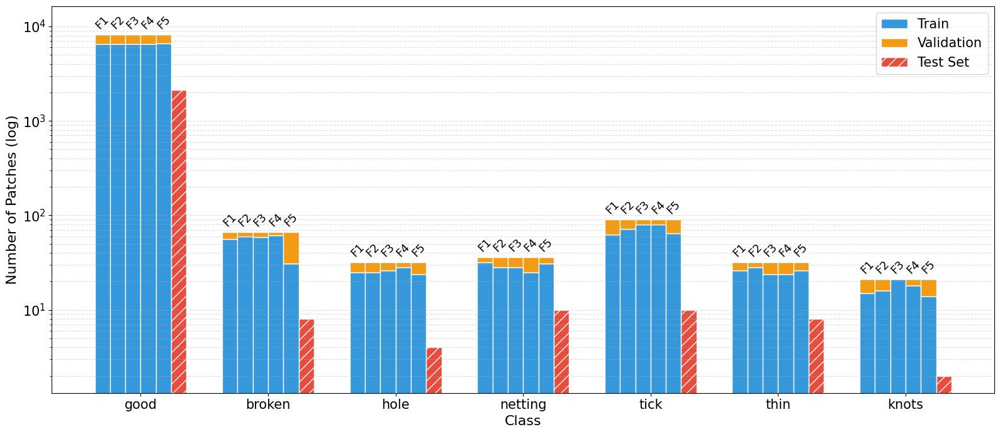


--- [Visual Phase 1: Patch Sample Inspection] ---


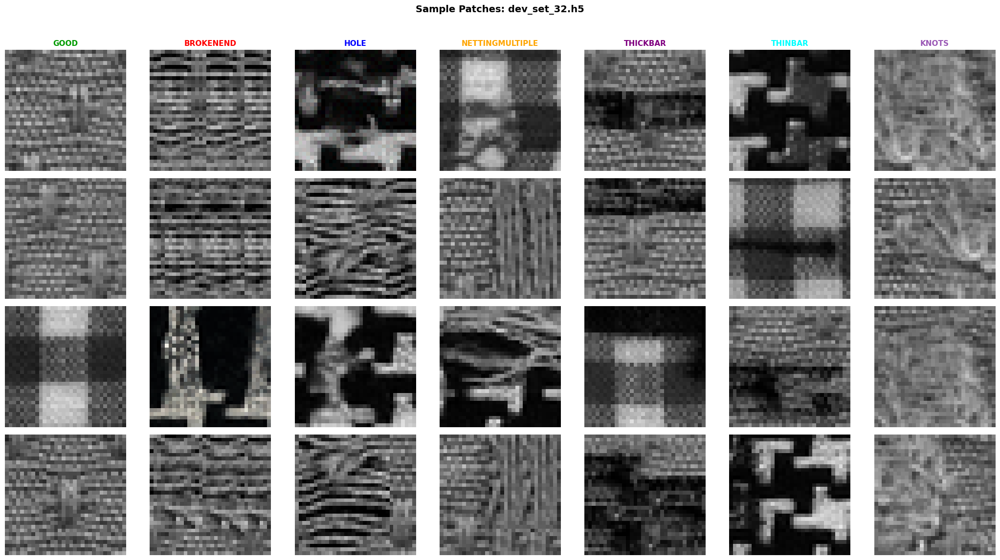


--- [Visual Phase 2: Full Image Spatial Reconstruction] ---
🔍 Reconstructing test images from container: /kaggle/working/hku_32/test_set_32.h5
🖼️ Rendering 4 reconstructed images in a 2x2 grid...



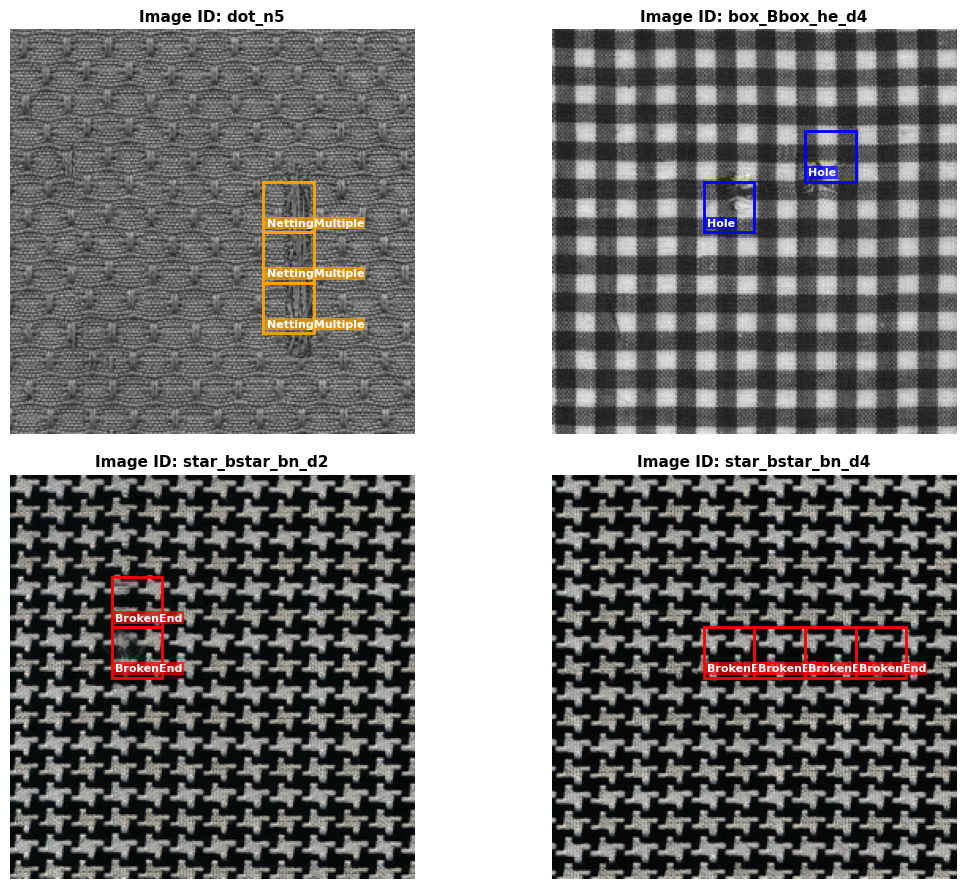

📊 EXECUTING EDA PIPELINE: HKU | 64x64 px
Target Directory: /kaggle/working/hku_64

📊 Summary Table: Distribution Across Splits (HKU)


,Split,Images,Total Patches,good,BrokenEnd,Hole,NettingMultiple,ThickBar,ThinBar,Knots
0,Test_Set,34,544,516,6,4,5,4,7,2
1,Fold_0_Train,105,1680,1583,20,15,18,23,19,2
2,Fold_0_Val,27,432,404,6,4,3,9,5,1
3,Fold_1_Train,105,1680,1580,22,13,14,27,21,3
4,Fold_1_Val,27,432,407,4,6,7,5,3,0
5,Fold_2_Train,106,1696,1595,22,15,15,28,18,3
6,Fold_2_Val,26,416,392,4,4,6,4,6,0
7,Fold_3_Train,106,1696,1594,22,16,18,27,18,1
8,Fold_3_Val,26,416,393,4,3,3,5,6,2
9,Fold_4_Train,106,1696,1596,18,17,19,23,20,3



📐 GEOMETRIC MASK METRICS (GROUND TRUTH VS PATCHES):
  • Dev Set Mean Pixel IoU:  0.20321 (113,489 / 558,472 px)
  • Test Set Mean Pixel IoU: 0.10526 (12,426 / 118,052 px)
  • Global Mean Pixel IoU:   0.18612 (125,915 / 676,524 px)

🧵 Fabric Surface Crosstabulation Matrix (HKU)


Class,BrokenEnd,Hole,Knots,NettingMultiple,ThickBar,ThinBar,good
Fabric,,,,,,,
box,10,8,0,11,10,10,847
dot,12,8,5,9,19,10,897
star,10,7,0,6,7,11,759


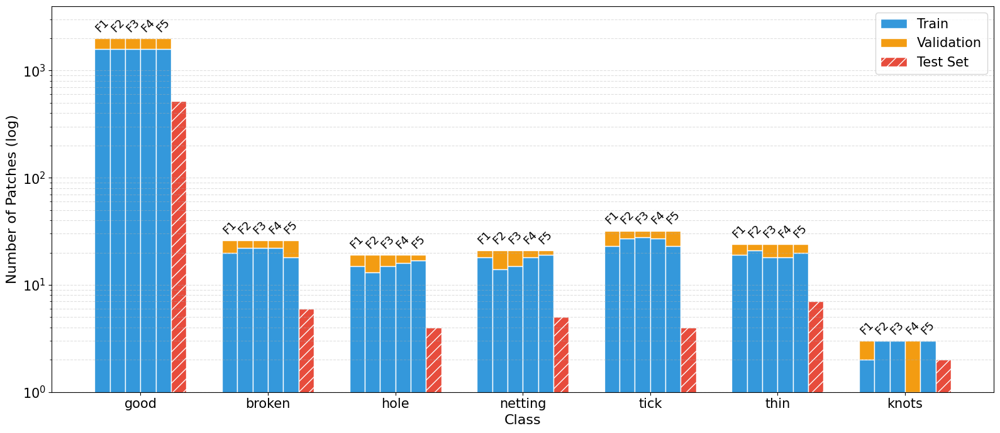


--- [Visual Phase 1: Patch Sample Inspection] ---


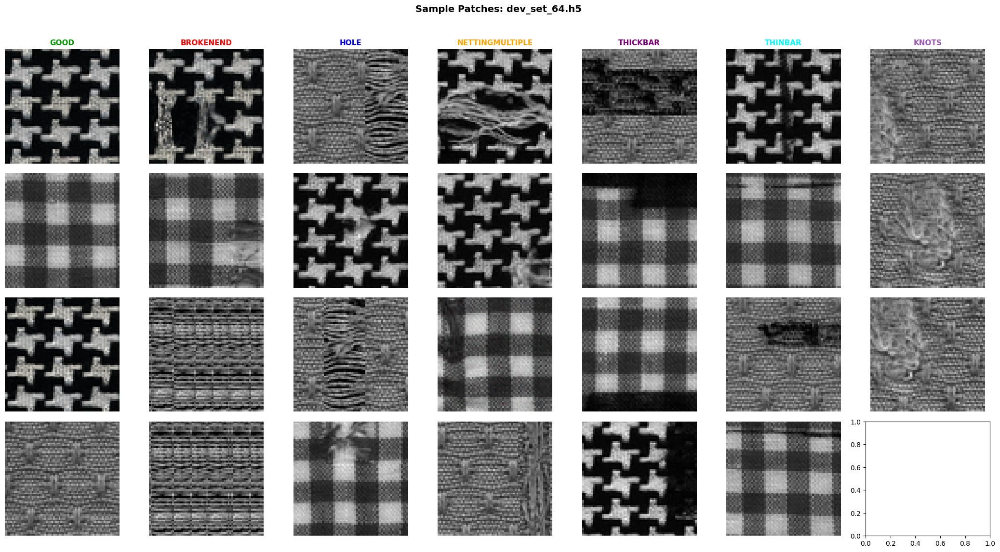


--- [Visual Phase 2: Full Image Spatial Reconstruction] ---
🔍 Reconstructing test images from container: /kaggle/working/hku_64/test_set_64.h5
🖼️ Rendering 4 reconstructed images in a 2x2 grid...



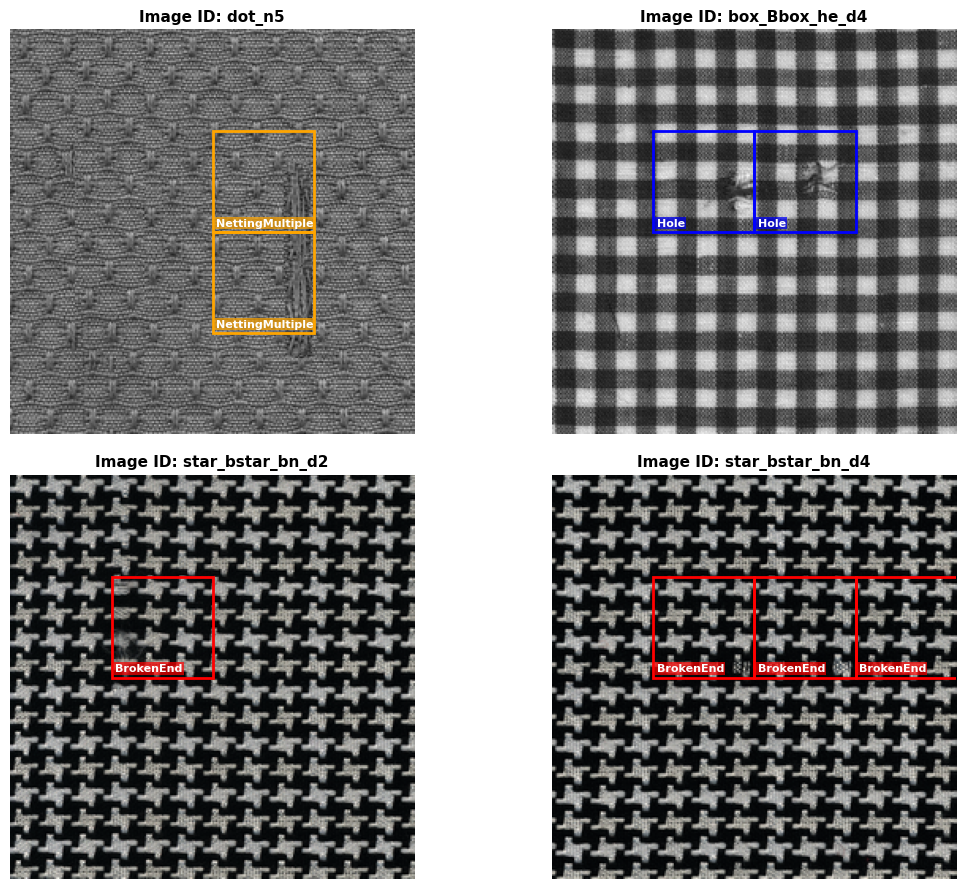

📊 EXECUTING EDA PIPELINE: HKU | 128x128 px
Target Directory: /kaggle/working/hku_128

📊 Summary Table: Distribution Across Splits (HKU)


,Split,Images,Total Patches,good,BrokenEnd,Hole,NettingMultiple,ThickBar,ThinBar,Knots
0,Test_Set,34,136,116,3,4,4,4,3,2
1,Fold_0_Train,105,420,346,13,13,13,16,16,3
2,Fold_0_Val,27,108,88,4,3,2,6,4,1
3,Fold_1_Train,105,420,346,13,11,10,19,18,3
4,Fold_1_Val,27,108,88,4,5,5,3,2,1
5,Fold_2_Train,106,424,348,15,12,12,18,15,4
6,Fold_2_Val,26,104,86,2,4,3,4,5,0
7,Fold_3_Train,106,424,347,14,14,12,19,15,3
8,Fold_3_Val,26,104,87,3,2,3,3,5,1
9,Fold_4_Train,106,424,349,13,14,13,16,16,3



📐 GEOMETRIC MASK METRICS (GROUND TRUTH VS PATCHES):
  • Dev Set Mean Pixel IoU:  0.08254 (129,629 / 1,570,428 px)
  • Test Set Mean Pixel IoU: 0.04101 (13,531 / 329,939 px)
  • Global Mean Pixel IoU:   0.07533 (143,160 / 1,900,367 px)

🧵 Fabric Surface Crosstabulation Matrix (HKU)


Class,BrokenEnd,Hole,Knots,NettingMultiple,ThickBar,ThinBar,good
Fabric,,,,,,,
box,7,8,0,5,8,9,187
dot,7,7,6,8,12,7,193
star,6,5,0,6,6,7,170


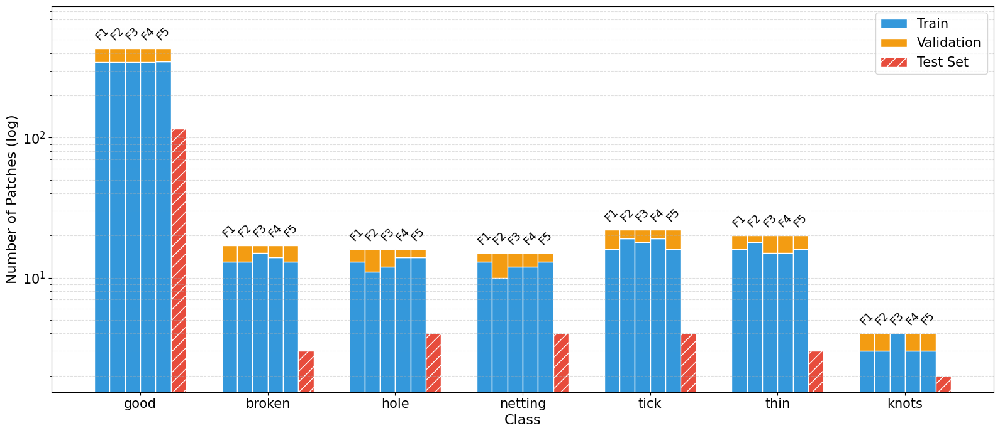


--- [Visual Phase 1: Patch Sample Inspection] ---


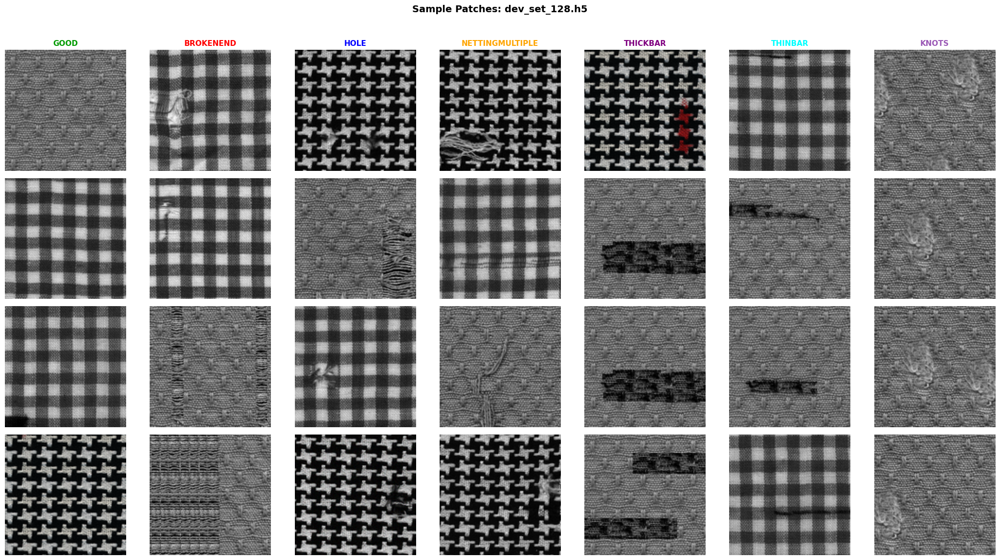


--- [Visual Phase 2: Full Image Spatial Reconstruction] ---
🔍 Reconstructing test images from container: /kaggle/working/hku_128/test_set_128.h5
🖼️ Rendering 4 reconstructed images in a 2x2 grid...



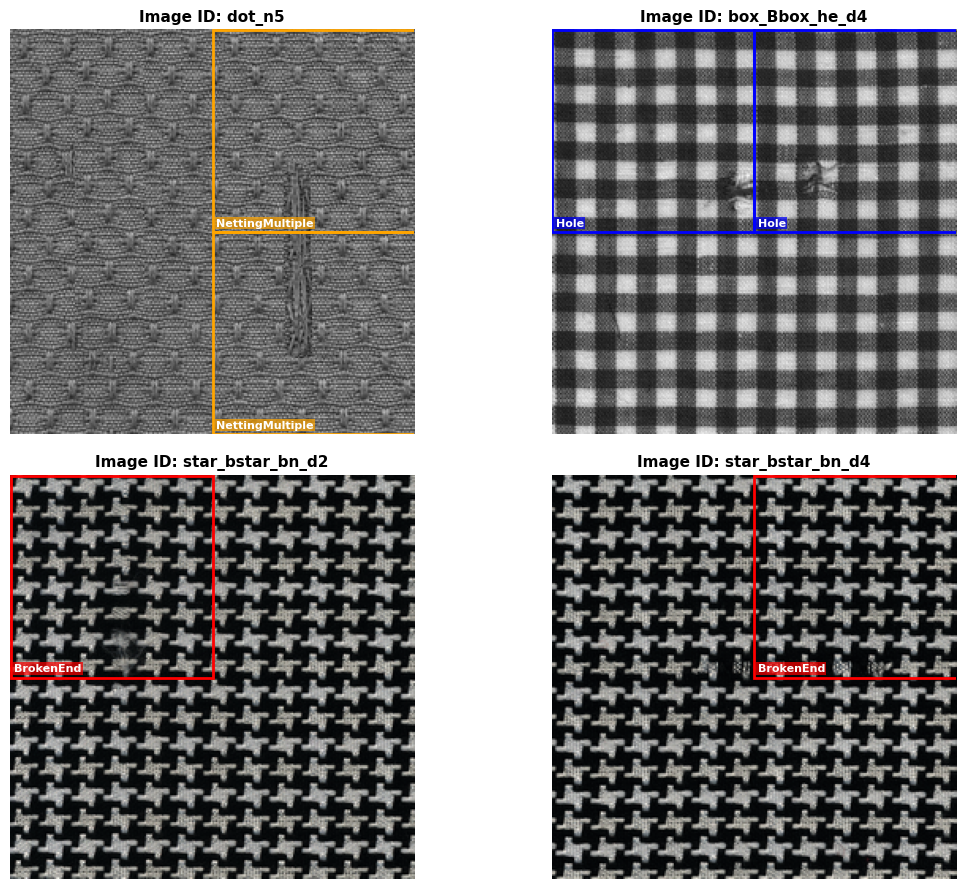

📊 TABLE 1: MACRO DATASET METRICS (AGGREGATED DEV + TEST)


,Global Metric,32x32,64x64,128x128
0,Defective (%),3.01,5.76,17.17
1,Good (%),96.99,94.24,82.83
2,Mean IoU,0.3782,0.1861,0.0753


TABLE 2: GRANULAR CLASS COUNTS & METRICS BY SPLIT


Resolution   Class / Metric   32x32           64x64         128x128        
Split                           Dev    Test     Dev    Test     Dev    Test
0                      Good    8170    2134    1987     516     434     116
1                 Brokenend      67       8      26       6      17       3
2                      Hole      32       4      19       4      16       4
3           Nettingmultiple      36      10      21       5      15       4
4                  Thickbar      90      10      32       4      22       4
5                   Thinbar      32       8      24       7      20       3
6                     Knots      21       2       3       2       4       2
7             Total Patches    8448    2176    2112     544     528     136
8             Defective (%)    3.29    1.93    5.92    5.15   17.80   14.71
9                  Good (%)   96.71   98.07   94.08   94.85   82.20   85.29
10                 Mean IoU  0.3923  0.2801  0.2032  0.1053  0.0825  0.0410

In [12]:
custom_labels = ["good", "broken", "hole", "netting", "tick", "thin", "knots"]
# 1. Collect raw reports across resolutions
raw_reports = {}
for res in PATCH_SIZES:
    res_key = f"{res}x{res}"
    raw_reports[res_key] = visualize_dataset_eda(dataset_name="HKU", resolution=res, custom_labels=custom_labels)

# TABLE 1: GLOBAL DATASET METRICS VS. PATCH RESOLUTION
df_global_metrics = pd.DataFrame({res: data["Global"] for res, data in raw_reports.items()})
df_global_metrics.index.name = "Global Metric"
df_global_metrics = df_global_metrics.reset_index()

print("📊 TABLE 1: MACRO DATASET METRICS (AGGREGATED DEV + TEST)")
display(df_global_metrics)

# TABLE 2: CLASS DISTRIBUTION AND METRICS BY SPLIT (DEV VS TEST)
split_tuples = {}
for res, data in raw_reports.items():
    split_tuples[(res, "Dev")] = data["Dev"]
    split_tuples[(res, "Test")] = data["Test"]

df_split_report = pd.DataFrame(split_tuples)
df_split_report.columns = pd.MultiIndex.from_tuples(
    df_split_report.columns, names=["Resolution", "Split"]
)
df_split_report.index.name = "Class / Metric"
df_split_report = df_split_report.reset_index()

print("TABLE 2: GRANULAR CLASS COUNTS & METRICS BY SPLIT")
display(df_split_report)

## TILDA

📊 EXECUTING EDA PIPELINE: TILDA | 32x32 px
Target Directory: /kaggle/working/tilda_32

📊 Summary Table: Distribution Across Splits (TILDA)


,Split,Images,Total Patches,good,hole,objects,oil spot,thread error
0,Test_Set,80,30720,29812,118,331,238,221
1,Fold_0_Train,256,98304,95564,316,1025,806,593
2,Fold_0_Val,64,24576,23968,50,201,183,174
3,Fold_1_Train,256,98304,95790,298,825,768,623
4,Fold_1_Val,64,24576,23742,68,401,221,144
5,Fold_2_Train,256,98304,95560,294,1032,801,617
6,Fold_2_Val,64,24576,23972,72,194,188,150
7,Fold_3_Train,256,98304,95614,287,1036,761,606
8,Fold_3_Val,64,24576,23918,79,190,228,161
9,Fold_4_Train,256,98304,95600,269,986,820,629



📐 GEOMETRIC MASK METRICS (GROUND TRUTH VS PATCHES):
  • Dev Set Mean Pixel IoU:  0.50404 (1,934,207 / 3,837,442 px)
  • Test Set Mean Pixel IoU: 0.48528 (505,367 / 1,041,390 px)
  • Global Mean Pixel IoU:   0.50003 (2,439,574 / 4,878,832 px)

🧵 Fabric Surface Crosstabulation Matrix (TILDA)


Class,good,hole,objects,oil spot,thread error
Fabric,,,,,
plain,149344,484,1557,1227,988


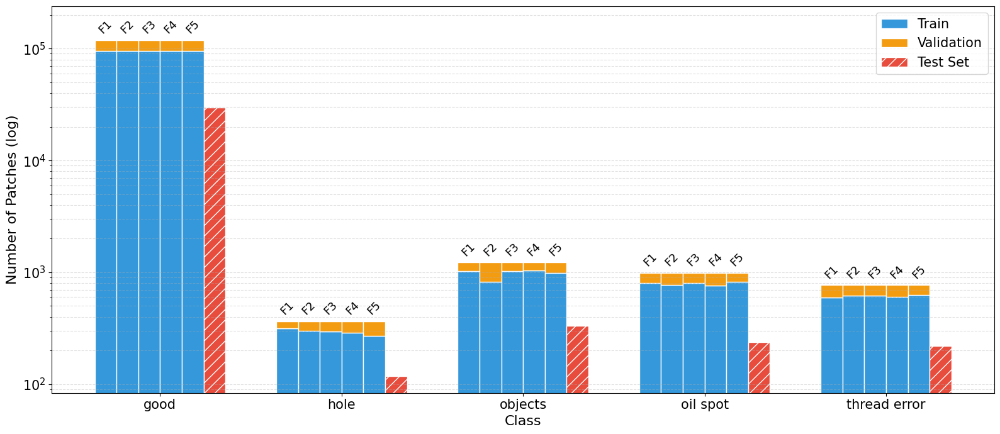


--- [Visual Phase 1: Patch Sample Inspection] ---


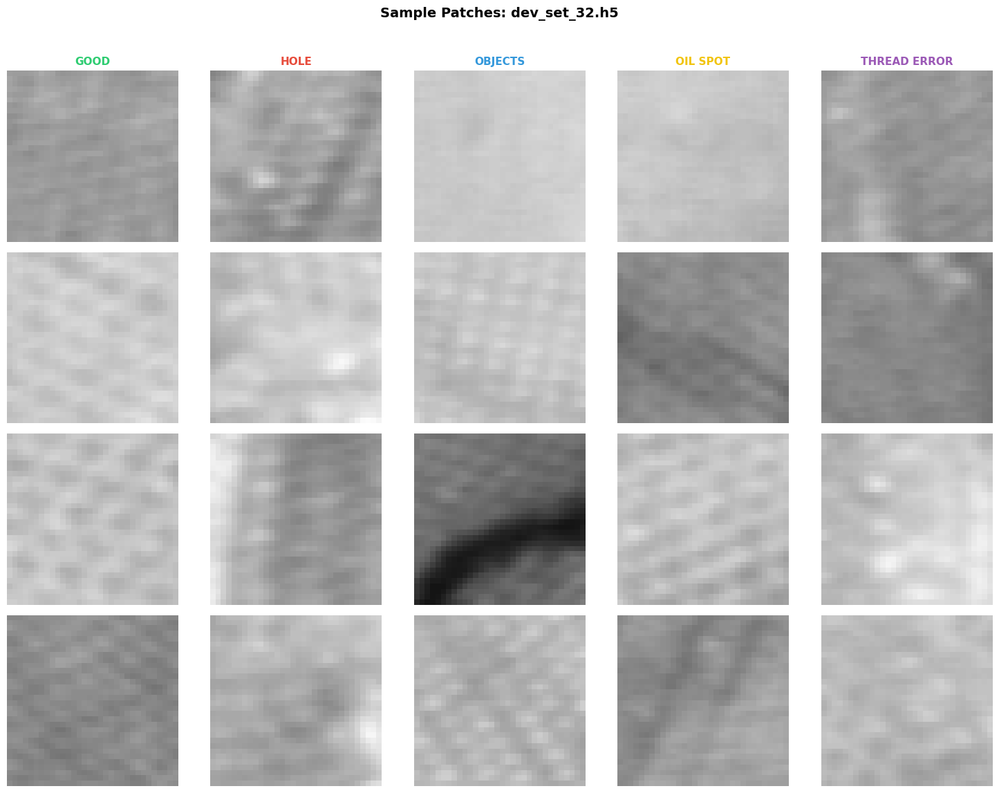


--- [Visual Phase 2: Full Image Spatial Reconstruction] ---
🔍 Reconstructing test images from container: /kaggle/working/tilda_32/test_set_32.h5
🖼️ Rendering 4 reconstructed images in a 2x2 grid...



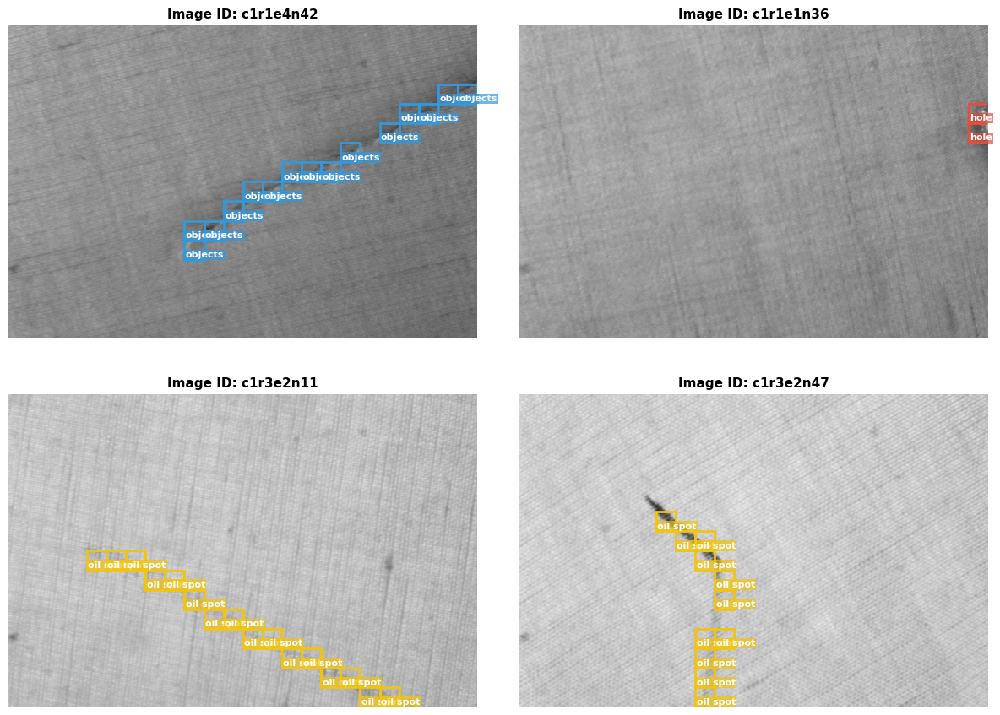

📊 EXECUTING EDA PIPELINE: TILDA | 64x64 px
Target Directory: /kaggle/working/tilda_64

📊 Summary Table: Distribution Across Splits (TILDA)


,Split,Images,Total Patches,good,hole,objects,oil spot,thread error
0,Test_Set,80,7680,7309,53,132,92,94
1,Fold_0_Train,256,24576,23487,144,402,308,235
2,Fold_0_Val,64,6144,5905,26,83,62,68
3,Fold_1_Train,256,24576,23567,139,333,290,247
4,Fold_1_Val,64,6144,5825,31,152,80,56
5,Fold_2_Train,256,24576,23498,136,407,290,245
6,Fold_2_Val,64,6144,5894,34,78,80,58
7,Fold_3_Train,256,24576,23509,133,407,287,240
8,Fold_3_Val,64,6144,5883,37,78,83,63
9,Fold_4_Train,256,24576,23507,128,391,305,245



📐 GEOMETRIC MASK METRICS (GROUND TRUTH VS PATCHES):
  • Dev Set Mean Pixel IoU:  0.30818 (1,833,450 / 5,949,335 px)
  • Test Set Mean Pixel IoU: 0.29240 (483,395 / 1,653,186 px)
  • Global Mean Pixel IoU:   0.30475 (2,316,845 / 7,602,521 px)

🧵 Fabric Surface Crosstabulation Matrix (TILDA)


Class,good,hole,objects,oil spot,thread error
Fabric,,,,,
plain,36701,223,617,462,397


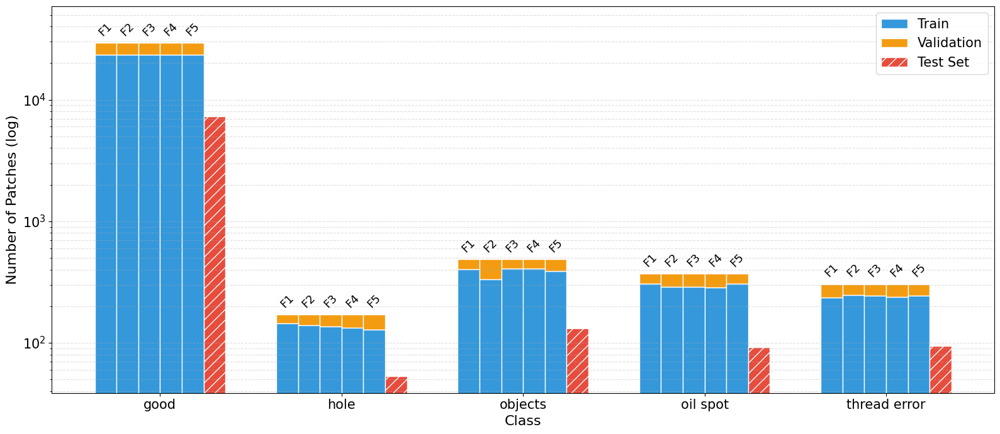


--- [Visual Phase 1: Patch Sample Inspection] ---


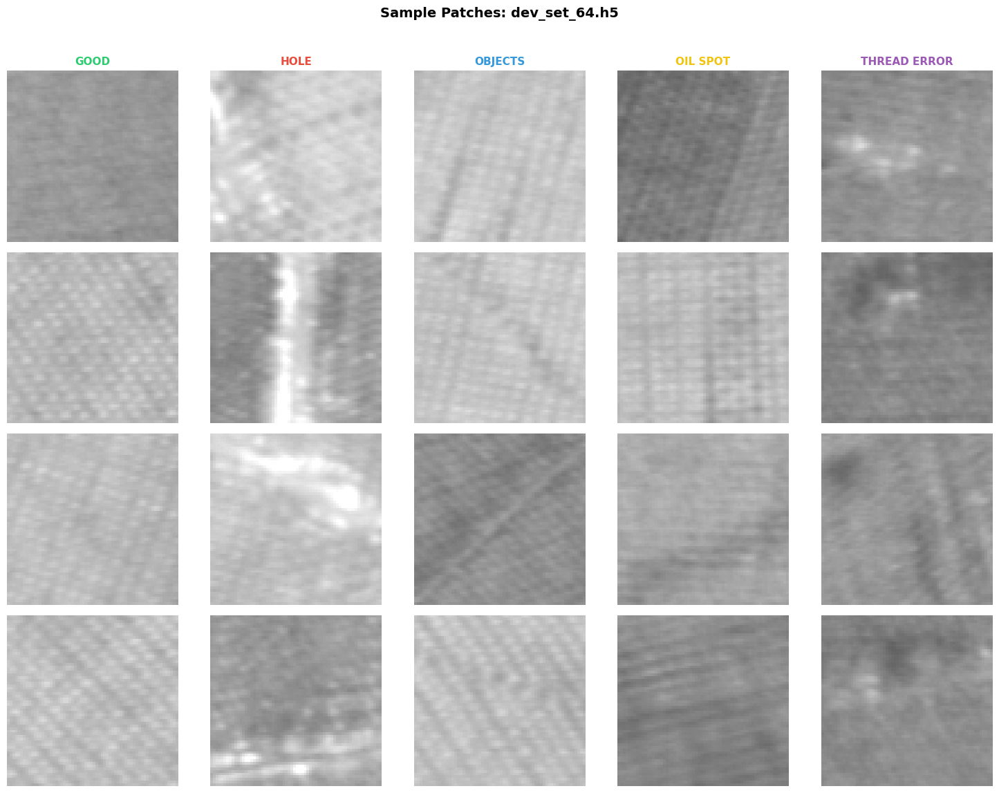


--- [Visual Phase 2: Full Image Spatial Reconstruction] ---
🔍 Reconstructing test images from container: /kaggle/working/tilda_64/test_set_64.h5
🖼️ Rendering 4 reconstructed images in a 2x2 grid...



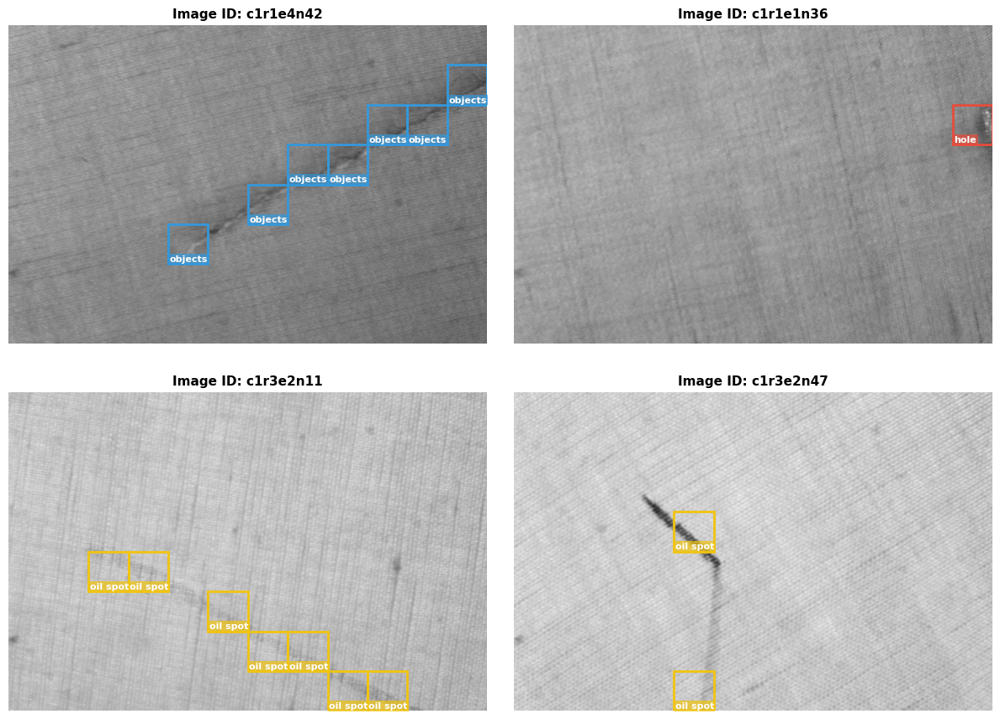

📊 EXECUTING EDA PIPELINE: TILDA | 128x128 px
Target Directory: /kaggle/working/tilda_128

📊 Summary Table: Distribution Across Splits (TILDA)


,Split,Images,Total Patches,good,hole,objects,oil spot,thread error
0,Test_Set,80,1920,1736,32,61,51,40
1,Fold_0_Train,256,6144,5593,96,193,151,111
2,Fold_0_Val,64,1536,1415,20,41,33,27
3,Fold_1_Train,256,6144,5633,96,164,146,105
4,Fold_1_Val,64,1536,1375,20,70,38,33
5,Fold_2_Train,256,6144,5605,91,194,140,114
6,Fold_2_Val,64,1536,1403,25,40,44,24
7,Fold_3_Train,256,6144,5603,94,190,148,109
8,Fold_3_Val,64,1536,1405,22,44,36,29
9,Fold_4_Train,256,6144,5598,87,195,151,113



📐 GEOMETRIC MASK METRICS (GROUND TRUTH VS PATCHES):
  • Dev Set Mean Pixel IoU:  0.15725 (1,814,519 / 11,538,826 px)
  • Test Set Mean Pixel IoU: 0.15040 (474,789 / 3,156,832 px)
  • Global Mean Pixel IoU:   0.15578 (2,289,308 / 14,695,658 px)

🧵 Fabric Surface Crosstabulation Matrix (TILDA)


Class,good,hole,objects,oil spot,thread error
Fabric,,,,,
plain,8744,148,295,235,178


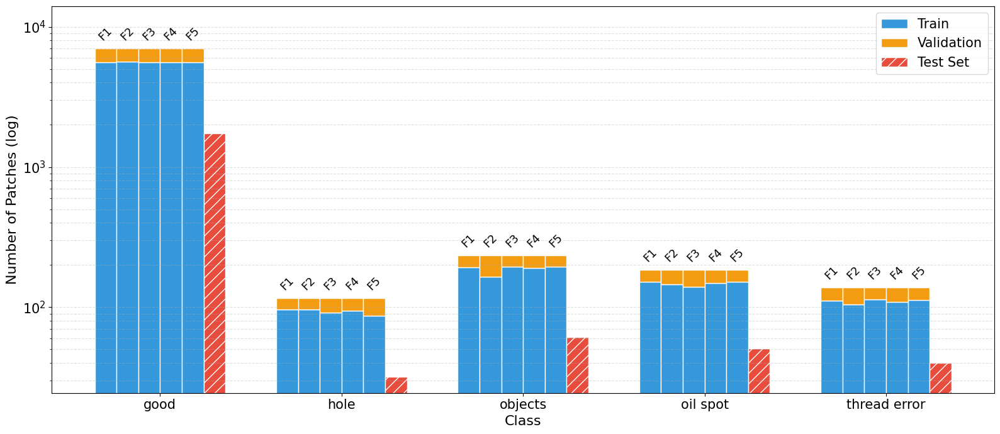


--- [Visual Phase 1: Patch Sample Inspection] ---


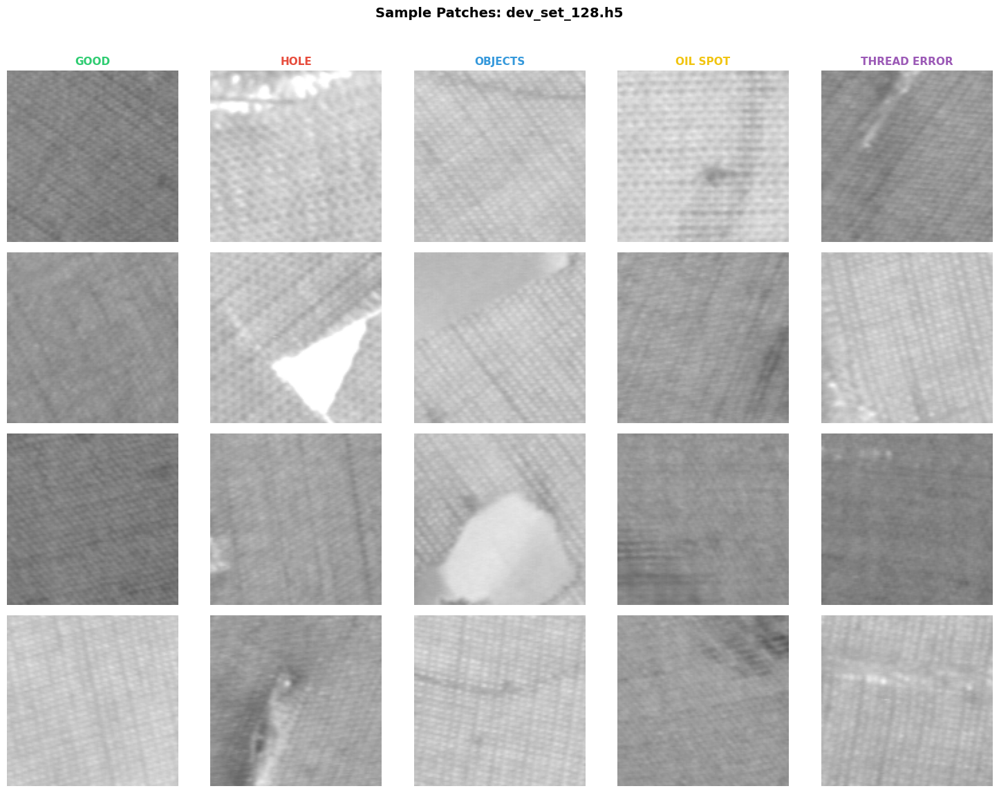


--- [Visual Phase 2: Full Image Spatial Reconstruction] ---
🔍 Reconstructing test images from container: /kaggle/working/tilda_128/test_set_128.h5
🖼️ Rendering 4 reconstructed images in a 2x2 grid...



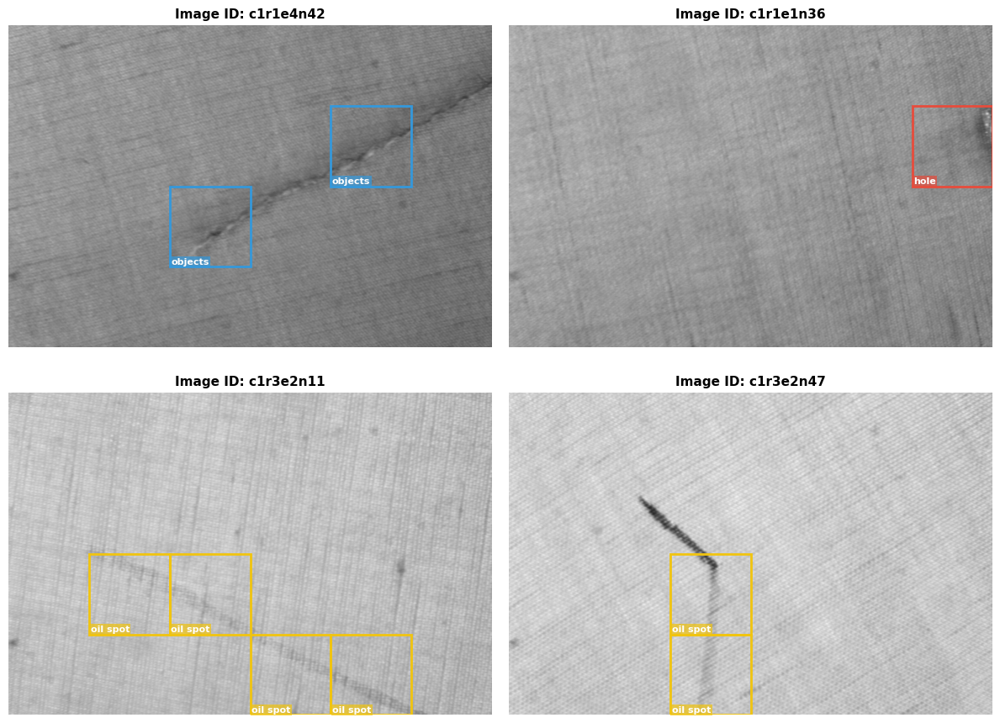

📊 TABLE 1: MACRO DATASET METRICS (AGGREGATED DEV + TEST)


,Global Metric,32x32,64x64,128x128
0,Defective (%),2.77,4.42,8.92
1,Good (%),97.23,95.58,91.08
2,Mean IoU,0.5000,0.3047,0.1558


TABLE 2: GRANULAR CLASS COUNTS & METRICS BY SPLIT


Resolution Class / Metric   32x32           64x64         128x128        
Split                         Dev    Test     Dev    Test     Dev    Test
0                    Good  119532   29812   29392    7309    7008    1736
1                    Hole     366     118     170      53     116      32
2                 Objects    1226     331     485     132     234      61
3                Oil spot     989     238     370      92     184      51
4            Thread error     767     221     303      94     138      40
5           Total Patches  122880   30720   30720    7680    7680    1920
6           Defective (%)    2.72    2.96    4.32    4.83    8.75    9.58
7                Good (%)   97.28   97.04   95.68   95.17   91.25   90.42
8                Mean IoU  0.5040  0.4853  0.3082  0.2924  0.1573  0.1504

In [13]:
# 1. Collect raw reports across resolutions
raw_reports = {}
for res in PATCH_SIZES:
    res_key = f"{res}x{res}"
    raw_reports[res_key] = visualize_dataset_eda(dataset_name="TILDA", resolution=res)

# TABLE 1: GLOBAL DATASET METRICS VS. PATCH RESOLUTION
df_global_metrics = pd.DataFrame({res: data["Global"] for res, data in raw_reports.items()})
df_global_metrics.index.name = "Global Metric"
df_global_metrics = df_global_metrics.reset_index()

print("📊 TABLE 1: MACRO DATASET METRICS (AGGREGATED DEV + TEST)")
display(df_global_metrics)

# TABLE 2: CLASS DISTRIBUTION AND METRICS BY SPLIT (DEV VS TEST)
split_tuples = {}
for res, data in raw_reports.items():
    split_tuples[(res, "Dev")] = data["Dev"]
    split_tuples[(res, "Test")] = data["Test"]

df_split_report = pd.DataFrame(split_tuples)
df_split_report.columns = pd.MultiIndex.from_tuples(
    df_split_report.columns, names=["Resolution", "Split"]
)
df_split_report.index.name = "Class / Metric"
df_split_report = df_split_report.reset_index()

print("TABLE 2: GRANULAR CLASS COUNTS & METRICS BY SPLIT")
display(df_split_report)